In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

In [2]:
with xr.open_dataset('data/MERRA-2/merged.nc4') as ds:
    ds.load()
    
df = ds.to_dataframe()
df.index.set_names(['lat', 'lon', 'Date'], inplace=True)
df.reset_index(inplace=True)

# take only those values that cover Houston
north, south, east, west = (30.5, 29, -94.5, -96)

filt = (df['lat'] > south) & (df['lat'] < north) & (df['lon'] > west) & (df['lon'] < east)
df = df[filt]

df['PM2.5'] = df['PM2.5'] * 1e9

df

,lat,lon,Date,SSSMASS25,DUSCATAU,BCSCATAU,DUEXTTAU,BCFLUXU,OCFLUXV,BCANGSTR,...,SLP,TQV,V2M,TROPQ,V10M,U50M,U10M,QV2M,TROPPV,QV10M
94256,29.5,-95.625,2015-01-01,4.533399e-10,0.002021,0.002087,0.002156,0.000004,0.000019,1.512882,...,102502.109375,33.872681,-2.449461,0.000014,-3.480748,-2.715095,-2.106504,0.005170,12385.588867,0.005072
94257,29.5,-95.625,2015-01-02,6.423546e-10,0.001370,0.002210,0.001459,0.000005,0.000035,1.496467,...,101835.914062,35.265064,-1.914652,0.000012,-2.711771,-1.203307,-0.913161,0.006570,11865.560547,0.006467
94258,29.5,-95.625,2015-01-03,5.319692e-10,0.001622,0.003452,0.001729,0.000011,0.000058,1.491463,...,101459.898438,35.948349,-1.075062,0.000006,-1.526446,3.363282,2.576123,0.007270,11325.949219,0.007129
94259,29.5,-95.625,2015-01-04,9.017004e-10,0.004917,0.001290,0.005263,0.000008,0.000015,1.427629,...,102459.328125,8.960220,-2.824340,0.000018,-4.190116,1.659939,1.085879,0.005313,12323.019531,0.005246
94260,29.5,-95.625,2015-01-05,1.128566e-09,0.001995,0.001070,0.002119,0.000004,0.000009,1.458390,...,103588.531250,4.468480,-2.647162,0.000015,-3.835776,-1.352524,-0.990397,0.003287,13011.084961,0.003148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120555,30.0,-95.000,2020-12-27,2.644830e-09,0.004314,0.000919,0.004610,0.000004,-0.000003,1.420772,...,101785.757812,17.180527,1.702342,0.000003,3.421182,-2.415095,-1.175590,0.008967,9196.285156,0.008873
120556,30.0,-95.000,2020-12-28,2.339227e-09,0.003801,0.000975,0.004061,0.000004,0.000005,1.430284,...,102062.609375,21.724472,1.224436,0.000004,2.619898,-2.311006,-1.453111,0.010594,10317.959961,0.010533
120557,30.0,-95.000,2020-12-29,2.954295e-09,0.002281,0.000758,0.002430,0.000004,0.000015,1.418531,...,102127.914062,19.218693,1.293051,0.000003,2.436874,-6.182795,-3.710495,0.009742,9860.671875,0.009654
120558,30.0,-95.000,2020-12-30,5.271861e-09,0.001837,0.000935,0.001960,0.000005,0.000028,1.424324,...,101397.546875,25.310759,1.794293,0.000002,3.386426,-4.566867,-2.814300,0.012001,10461.372070,0.011901


In [3]:
train_filt = df['Date'] < '2016-01-01'
val_filt = (df['Date'] > '2015-12-31') & (df['Date'] < '2017-01-01')
test_filt = df['Date'] > '2019-12-31'

def subset_dataframe(df, filt):
    # the PM2.5 column is a linear combination of these components. drop them, they are redundant
    pm_components = ['DUSMASS25', 'SSSMASS25', 'BCSMASS', 'OCSMASS', 'SO4SMASS']
    
    df = df[filt] \
        .set_index('Date') \
        .drop(['lat', 'lon'] + pm_components, axis='columns') \
        .sort_index()
    
    df['Month'] = df.index.month
    return df


train = subset_dataframe(df, train_filt)
val = subset_dataframe(df, val_filt)
test = subset_dataframe(df, test_filt)

display(train)
display(val)
display(test)

,DUSCATAU,BCSCATAU,DUEXTTAU,BCFLUXU,OCFLUXV,BCANGSTR,SUFLUXV,SSSMASS,BCCMASS,SO4CMASS,...,TQV,V2M,TROPQ,V10M,U50M,U10M,QV2M,TROPPV,QV10M,Month
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,0.002021,0.002087,0.002156,0.000004,0.000019,1.512882,2.873405e-05,2.579083e-09,5.609769e-07,0.000006,...,33.872681,-2.449461,0.000014,-3.480748,-2.715095,-2.106504,0.005170,12385.588867,0.005072,1
2015-01-01,0.002194,0.002108,0.002341,0.000004,0.000019,1.517815,3.149574e-05,9.559881e-10,5.488358e-07,0.000006,...,32.573849,-1.539559,0.000014,-2.542210,-1.928559,-1.417902,0.004916,12421.088867,0.004818,1
2015-01-01,0.002188,0.002031,0.002334,0.000004,0.000018,1.517269,2.883339e-05,1.330290e-09,5.292101e-07,0.000005,...,32.869099,-1.274900,0.000013,-2.237665,-2.462842,-1.772416,0.005039,12178.838867,0.004922,1
2015-01-01,0.002055,0.002032,0.002192,0.000004,0.000017,1.515101,2.520745e-05,6.854106e-09,5.407740e-07,0.000005,...,34.214149,-2.887856,0.000013,-3.706089,-4.209060,-3.456308,0.005820,12082.504883,0.005627,1
2015-01-02,0.001370,0.002210,0.001459,0.000005,0.000035,1.496467,5.385778e-05,2.359006e-09,6.635133e-07,0.000009,...,35.265064,-1.914652,0.000012,-2.711771,-1.203307,-0.913161,0.006570,11865.560547,0.006467,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-30,0.006748,0.001997,0.007234,0.000007,0.000026,1.474499,2.980097e-05,9.789667e-09,6.628606e-07,0.000009,...,27.163006,-2.449745,0.000004,-3.539171,-1.862008,-1.249392,0.006935,12052.664062,0.006787,12
2015-12-31,0.005114,0.001779,0.005473,0.000004,0.000008,1.478228,-1.185979e-06,5.507084e-09,5.675530e-07,0.000007,...,32.787579,-3.899598,0.000015,-5.035186,-3.205465,-2.554789,0.007195,11269.102539,0.006975,12
2015-12-31,0.004943,0.001564,0.005292,0.000004,0.000008,1.464691,-1.651059e-06,3.522017e-09,5.443572e-07,0.000006,...,29.052227,-2.872966,0.000016,-4.159616,-2.753683,-2.003661,0.006481,11517.602539,0.006353,12


,DUSCATAU,BCSCATAU,DUEXTTAU,BCFLUXU,OCFLUXV,BCANGSTR,SUFLUXV,SSSMASS,BCCMASS,SO4CMASS,...,TQV,V2M,TROPQ,V10M,U50M,U10M,QV2M,TROPPV,QV10M,Month
Date,,,,,,,,,,,,,,,,,,,,,
2016-01-01,0.004445,0.001571,0.004747,0.000002,4.377713e-07,1.466621,-0.000022,1.494693e-09,5.378739e-07,0.000006,...,30.685148,-3.589994,0.000004,-5.161899,-2.707997,-1.889460,0.005601,11206.639648,0.005483,1
2016-01-01,0.004352,0.001494,0.004650,0.000002,4.917879e-07,1.458290,-0.000021,1.148331e-09,5.387956e-07,0.000006,...,27.656828,-2.427844,0.000004,-4.138746,-1.463312,-0.919139,0.005498,11282.389648,0.005372,1
2016-01-01,0.004341,0.001437,0.004638,0.000003,4.778181e-07,1.460717,-0.000022,1.761686e-09,5.108996e-07,0.000005,...,28.858000,-2.125313,0.000005,-3.846957,-2.137865,-1.349604,0.005570,11288.556641,0.005419,1
2016-01-01,0.004576,0.001605,0.004887,0.000002,1.453360e-07,1.474702,-0.000023,4.975859e-09,5.191650e-07,0.000006,...,31.911711,-4.710680,0.000005,-6.084629,-3.732187,-2.923466,0.006091,11236.806641,0.005844,1
2016-01-02,0.003562,0.001300,0.003801,0.000002,-1.209476e-06,1.441061,-0.000016,2.386093e-09,5.164412e-07,0.000004,...,25.208294,-2.289344,0.000003,-3.374847,-0.672954,-0.416312,0.005013,10441.932617,0.004853,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-30,0.003109,0.001350,0.003314,0.000003,-1.297136e-05,1.465199,-0.000006,5.420029e-09,4.677501e-07,0.000004,...,14.486372,-1.526142,0.000014,-2.412909,-2.627442,-1.782075,0.004410,13041.362305,0.004177,12
2016-12-31,0.001363,0.001477,0.001454,0.000005,1.684174e-05,1.527654,0.000033,5.270948e-08,3.749535e-07,0.000004,...,41.571194,1.628213,0.000009,2.327183,-1.343091,-0.725196,0.010589,9880.920898,0.010509,12
2016-12-31,0.001493,0.001701,0.001592,0.000006,1.809934e-05,1.527019,0.000039,4.331121e-08,4.282596e-07,0.000005,...,41.034084,0.781296,0.000009,1.362193,-0.750055,-0.135482,0.009830,9870.420898,0.009742,12


,DUSCATAU,BCSCATAU,DUEXTTAU,BCFLUXU,OCFLUXV,BCANGSTR,SUFLUXV,SSSMASS,BCCMASS,SO4CMASS,...,TQV,V2M,TROPQ,V10M,U50M,U10M,QV2M,TROPPV,QV10M,Month
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0.004481,0.001422,0.004794,0.000006,0.000015,1.454703,0.000029,4.943329e-09,5.409496e-07,0.000005,...,23.476912,0.604264,0.000009,0.829112,-2.043191,-1.485612,0.005465,12048.655273,0.005056,1
2020-01-01,0.004487,0.001379,0.004800,0.000006,0.000015,1.447090,0.000030,3.179744e-09,5.467849e-07,0.000005,...,20.358585,0.343964,0.000011,0.597211,-1.667660,-1.137152,0.004892,12751.738281,0.004466,1
2020-01-01,0.004532,0.001324,0.004847,0.000007,0.000015,1.446971,0.000027,2.583702e-09,5.230847e-07,0.000005,...,20.481306,0.251023,0.000009,0.519791,-1.755459,-1.188288,0.005122,12473.821289,0.004782,1
2020-01-01,0.004532,0.001381,0.004849,0.000006,0.000015,1.454350,0.000026,4.534038e-09,5.224736e-07,0.000005,...,23.670109,0.655799,0.000008,0.855046,-2.290043,-1.836857,0.005670,11584.238281,0.005298,1
2020-01-02,0.001386,0.001942,0.001478,0.000006,0.000046,1.530842,0.000088,1.072594e-08,4.680862e-07,0.000005,...,45.802021,0.901410,0.000007,1.331422,0.279131,0.352637,0.010927,11580.158203,0.010875,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-30,0.001961,0.001023,0.002095,0.000005,0.000031,1.423103,0.000042,3.349316e-08,4.600941e-07,0.000003,...,26.867399,3.051883,0.000002,4.463615,-5.347914,-3.656015,0.012464,10023.955078,0.012357,12
2020-12-31,0.001850,0.002071,0.001979,0.000006,0.000100,1.448492,0.000116,4.052649e-08,7.787236e-07,0.000006,...,36.825703,3.349418,0.000005,4.551053,-5.459151,-3.717329,0.012268,12593.268555,0.012250,12
2020-12-31,0.002059,0.002497,0.002205,0.000006,0.000106,1.465629,0.000127,3.279734e-08,8.484466e-07,0.000007,...,36.958515,2.744367,0.000005,4.009407,-3.491098,-2.151637,0.012333,12320.684570,0.012235,12


In [4]:
translations = {
    'PS': 'Surface pressure',
    'QV2M': '2-meter specific humidity',
    'QV10M': '10-meter specific humidity',
    'T2M': '2-meter air temperature',
    'T10M' : '10-meter air temperature',
    'U2M': '2-meter eastward wind',
    'V2M': '2-meter northward wind',
    'U50M': '50-meter eastward wind',
    'V50M': '50-meter northward wind',
    'U10M': '10-meter eastward wind',
    'V10M': '10-meter northward wind',
    'TQL': 'Total precipitable liquid water',
    'TQI': 'Total precipitable ice water',
    'TQV': 'Total precipitable water vapor',
    'ALBEDO': 'Surface albedo',
    'CLDTOT': 'Total cloud area fraction',
    'LWGAB': 'Surface absorbed longwave radiation',
    'LWGEM': 'Longwave flux emitted from surface',
    'SWGDN': 'Surface incoming shortwave flux',
    'PM2.5': 'PM2.5',
    'AODANA': 'Aerosol Optical Depth Analysis',
    'DUSCATAU': 'Dust Scattering AOT [550 nm]',
    'BCSCATAU': 'Black Carbon Scattering AOT [550 nm]',
    'DUEXTTAU': 'Dust Extinction AOT [550 nm]',
    'BCFLUXU': 'Black Carbon column u-wind mass flux',
    'OCFLUXV': 'Organic Carbon column v-wind mass flux',
    'BCANGSTR' : 'Black Carbon Angstrom parameter [470-870 nm]',
    'SUFLUXV' : 'SO4 column v-wind mass flux',
    'SSSMASS' : 'Sea Salt Surface Mass Concentration',
    'BCCMASS' : 'Black Carbon Column Mass Density',
    'SO4CMASS' : 'SO4 Column Mass Density',
    'SSFLUXU' : 'Sea Salt column u-wind mass flux',
    'DUCMASS' : 'Dust Column Mass Density',
    'SSEXTTAU' : 'Sea Salt Extinction AOT [550 nm]',
    'SO2CMASS' : 'SO2 Column Mass Density',
    'OCANGSTR' : 'Organic Carbon Angstrom parameter [470-870 nm]',
    'OCCMASS' : 'Organic Carbon Column Mass Density',
    'TOTEXTTAU' : 'Total Aerosol Extinction AOT [550 nm]',
    'DUSCAT25' : 'Dust Scattering AOT [550 nm] - PM 2.5',
    'TOTANGSTR' : 'Total Aerosol Angstrom parameter [470-870 nm]',
    'DMSCMASS' : 'Dust Scattering AOT [550 nm] - PM 2.5',
    'SSEXTT25' : 'Sea Salt Extinction AOT [550 nm] - PM 2.5',
    'DUANGSTR' : 'Dust Angstrom parameter [470-870 nm]',
    'DMSSMASS' : 'DMS Surface Mass Concentration',
    'BCEXTTAU' : 'Black Carbon Extinction AOT [550 nm]',
    'SSSCATAU' : 'Sea Salt Scattering AOT [550 nm]',
    'DUFLUXV' : 'Dust column v-wind mass flux',
    'DUFLUXU' : 'Dust column u-wind mass flux',
    'SUEXTTAU' : 'SO4 Extinction AOT [550 nm]',
    'SSFLUXV' : 'Sea Salt column v-wind mass flux',
    'DUCMASS25' : 'Dust Column Mass Density - PM 2.5',
    'OCEXTTAU' : 'Organic Carbon Extinction AOT [550 nm]',
    'SUANGSTR' : 'SO4 Angstrom parameter [470-870 nm]',
    'SSSCAT25' : 'Sea Salt Scattering AOT [550 nm] - PM 2.5',
    'SSCMASS25' : 'Sea Salt Column Mass Density - PM 2.5',
    'DUSMASS' : 'Dust Surface Mass Concentration',
    'SUFLUXU' : 'SO4 column u-wind mass flux',
    'BCFLUXV' : 'Black Carbon column v-wind mass flux',
    'SSCMASS' : 'Sea Salt Column Mass Density',
    'SUSCATAU' : 'SO4 Scattering AOT [550 nm]',
    'SO2SMASS' : 'SO2 Surface Mass Concentration',
    'SSANGSTR' : 'Sea Salt Angstrom parameter [470-870 nm]',
    'DUEXTT25' : 'Dust Extinction AOT [550 nm] - PM 2.5',
    'OCFLUXU' : 'Organic Carbon column u-wind mass flux',
    'OCSCATAU' : 'Organic Carbon Scattering AOT [550 nm]',
    'TOTSCATAU' : 'Total Aerosol Scattering AOT [550 nm]',
    'AODINC' : 'Aerosol Optical Depth Analysis Increment',
    'ALBNIRDF' : 'surface albedo for near infrared diffuse',
    'SWTDN' : 'toa incoming shortwave flux',
    'EMIS' : 'surface emissivity',
    'LWTUPCLRCLN' : 'upwelling longwave flux at toa assuming clear sky and no aerosol',
    'SWTNTCLR' : 'toa net downward shortwave flux assuming clear sky',
    'CLDHGH' : 'cloud area fraction for high clouds',
    'LWGABCLR' : 'surface absorbed longwave radiation assuming clear sky',
    'LWGABCLRCLN' : 'surface absorbed longwave radiation assuming clear sky and no aerosol',
    'LWGNTCLRCLN' : 'surface net downward longwave flux assuming clear sky and no aerosol',
    'SWGNTCLRCLN' : 'surface net downward shortwave flux assuming clear sky and no aerosol',
    'SWGNT' : 'sea ice net downward shortwave flux',
    'TAUMID' : 'in cloud optical thickness of middle clouds',
    'SWGNTCLR' : 'surface net downward shortwave flux assuming clear sky',
    'SWGNTCLN' : 'surface net downward shortwave flux assuming no aerosol',
    'LWGNTCLR' : 'surface net downward longwave flux assuming clear sky',
    'SWGDNCLR' : 'surface incoming shortwave flux assuming clear sky',
    'ALBVISDF' : 'surface albedo for visible diffuse',
    'LWTUPCLR' : 'upwelling longwave flux at toa assuming clear sky',
    'TAUTOT' : 'in cloud optical thickness of all clouds',
    'LWGNT' : 'sea ice net downward longwave flux',
    'CLDLOW' : 'cloud area fraction for low clouds',
    'ALBVISDR' : 'surface albedo for visible beam',
    'SWTNTCLRCLN' : 'toa net downward shortwave flux assuming clear sky and no aerosol',
    'TAUHGH' : 'in cloud optical thickness of high clouds(EXPORT)',
    'TAULOW' : 'in cloud optical thickness of low clouds',
    'CLDMID' : 'cloud area fraction for middle clouds',
    'SWTNTCLN' : 'toa net downward shortwave flux assuming no aerosol',
    'ALBNIRDR' : 'surface albedo for near infrared beam',
    'SWTNT' : 'toa net downward shortwave flux',
    'LWTUP' : 'upwelling longwave flux at toa',
    'TROPT' : 'tropopause temperature using blended TROPP estimate',
    'TROPPB' : 'tropopause pressure based on blended estimate',
    'TOX' : 'total column odd oxygen',
    'DISPH' : 'zero plane displacement height',
    'TO3' : 'total column ozone',
    'TS' : 'surface skin temperature',
    'TROPPT' : 'tropopause pressure based on thermal estimate',
    'SLP' : 'sea level pressure',
    'TROPQ' : 'tropopause specific humidity using blended TROPP estimate',
    'TROPPV' : 'tropopause pressure based on EPV estimate',
    'Month' : 'Month',
}

# Feature Selection

## Filter methods

The goal of feature selection is to identify relationships within the data that are most correlated with the target parameter. For the PM2.5 prediction, we have some hand-picked features which we are using because people in the past have also used them. It would be nice if a data-centered approach would also choose these features. Below, a set of filter feature selection methods will be employed and compared to the desired set of features.

- Pearson's correlation coefficient
- Variance threshold
- K-Best
- Percentile
- False positive rate
- False discovery rate
- Family-wise error

In [5]:
# modified version of https://github.com/scikit-learn/scikit-learn/issues/13405#issuecomment-689367508

def correlation_selection(df, threshold=.9, rowvar=False, take_absolute_value = False, *, var):
    """Remove any feature whose correlation with var is < threshold

    Parameters
    -----------

    X : ndarray of shape (n_samples, n_features)

    threshold : float, default=.9

    rowvar: bool, default=False If rowvar is True (default), then each row represents a variable, 
                                with observations in the columns. Otherwise, the relationship is 
                                transposed: each column represents a variable, while the rows contain 
                                observations.
                                
    take_absolute_value: bool, default=False If true, all features whose |correlation| > threshold are selected, 
                                             otherwise, only positivly correlated features are selected.
    
    var: string, the feature for which we are comparing the variance threshold for

    Returns
    --------

    filt : a boolean array that can be used to select the features that are to be used

    """

    # compute the variance between all variables
    # and select only the variances of var against all other variables
    corr = df.corr().loc[var]

    if take_absolute_value:
        filt = np.abs(corr) > threshold
    else:
        filt = corr > threshold

    return filt.values

In [6]:
def pearson_plot(df, var, **kwargs):
    
    params = {
        'desired_features': ['PS', 'T2M', 'U2M', 'V2M', 'U10M', 'V10M', 'TQL', 'TQV', 'CLDTOT', 'SWGDN', 'AODANA'],
        'desired_feature_color' : '#ff033e',
        'filter_selected_color':'black',
        'fontsize': 10
    }
    params.update(kwargs)
    
    # get the correlation of all variables, select the ones for PM2.5, and then drop PM2.5 since we don't care that
    # the correlation with itself is 1
    c = df.corr().loc[var].drop(var)

    # sort the array
    sorted_indexes = np.argsort(c.values)[::-1]
    c = c[sorted_indexes]
    corr = np.reshape(c.values, (len(c), 1))

    fig, ax = plt.subplots(dpi=600)

    # make a square array and fill the new values with np.nan so that they are not displayed
    s = int(np.ceil(np.sqrt(len(c))))
    a = np.zeros(s**2)
    a[:len(c)] = c
    # mask the invalid values
    a[len(c):] = np.nan
    a = np.reshape(a, (s, s))

    mappable = ax.pcolormesh(a, cmap='PRGn_r', vmin=-1, vmax=1)

    cbar = fig.colorbar(mappable, drawedges=False)
    cbar.outline.set_linewidth(0)

    # put the invalid values on the bottom right
    ax.invert_yaxis()

    for i in range(s):
        for j in range(s):
            if s*i + j < len(c):
                label = c.index[s*i + j]
                color = params['desired_feature_color'] if label in params['desired_features'] else params['filter_selected_color']
#                 color = 'black' if a[i, j] < 0.5 else 'white'
                text = ax.text(j+.5, i+0.5, f'{label}\n{a[i, j]:0.2f}',
                               ha="center", va="center", color=color, fontsize=params['fontsize'])

    ax.set_yticklabels([]);
    ax.set_xticklabels([]);

    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    fs_t = fig.text(0.3, 0.1, 'Undesired', horizontalalignment='center',
        verticalalignment='center', 
            color=params['filter_selected_color'])

    d_t = fig.text(.7, 0.1, 'Desired', horizontalalignment='center',
        verticalalignment='center', 
            color=params['desired_feature_color'])

    ax.set_title(f"{len(c)} features selected");
    fig.suptitle("Pearson's correlation of each variable with PM2.5");   

In [7]:
from matplotlib import cm
from matplotlib.lines import Line2D
from matplotlib import colors as mplColors

def feature_selection_plot(df, method, fig = None, ax=None, **kwargs):
    features = df.columns.values
    
    params = {
        'desired_features': ['PS', 'T2M', 'U2M', 'V2M', 'U10M', 'V10M', 'TQL', 'TQV', 'CLDTOT', 'SWGDN', 'AODANA'],
        'desired_feature_color' : 'orange',
        'filter_selected_color':'white',
        'alpha': 0.7,
        'fontsize': 10
    }
    
    params.update(kwargs)
    
    if ax is None:
        fig, ax = plt.subplots(dpi=600)

    # make a square array and fill the new values with np.nan so that they are not displayed
    s = int(np.ceil(np.sqrt(len(features))))
    a = np.zeros(s**2)
    # mask the invalid values
    a[len(features):] = np.nan
    a = np.reshape(a, (s, s))

    mappable = ax.pcolormesh(a, cmap=mplColors.ListedColormap(['purple']), alpha=params['alpha'], edgecolor='white')

    # put the invalid values on the bottom right
    ax.invert_yaxis()

    for i in range(s):
        for j in range(s):
            if s*i + j < len(features):
                label = features[s*i + j]
                color = params['desired_feature_color'] if label in params['desired_features'] else params['filter_selected_color']
                text = ax.text(j+.5, i+0.5, f'{label}',
                               ha="center", va="center", color=color, fontsize=params['fontsize'])

    ax.set_yticklabels([]);
    ax.set_xticklabels([]);

    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    if fig is not None:
        fs_t = fig.text(0.3, 0, 'Undesired', horizontalalignment='center',
            verticalalignment='center', 
                color=params['filter_selected_color'])

        d_t = fig.text(.7, 0, 'Desired', horizontalalignment='center',
            verticalalignment='center', 
                color=params['desired_feature_color'])

        fs_t.set_bbox(dict(facecolor='purple', alpha=params['alpha']))
        d_t.set_bbox(dict(facecolor='purple', alpha=params['alpha']))

    ax.set_title(f"{len(features)} Features selected by method: {method}");

In [8]:
from sklearn.feature_selection import VarianceThreshold, mutual_info_regression, f_regression, SelectKBest, SelectPercentile, SelectFpr, SelectFdr, SelectFwe
from yellowbrick.features import Rank2D

def plot_selected_features(df, prediction_feature, excluded_pearson_vars, filters,
                     pearson_fs = 10,
                     correlation_fs = 10,
                     variance_fs = 10, 
                     kbest_fs = 10, 
                     percentile_fs = 10, 
                     fp_fs = 10, 
                     fd_fs = 10, 
                     fwe_fs = 10):
    x, y = df.drop(prediction_feature, axis=1), df[prediction_feature]
    
    #
    # Plot Pearson
    #
    fig, ax = plt.subplots(figsize=(6, 6), dpi=600)

    pearson_vars = df.drop(excluded_pearson_vars, axis=1)
    visualizer = Rank2D(algorithm='pearson', ax=ax, colormap='PRGn_r')
    visualizer.fit(pearson_vars)
    visualizer.transform(pearson_vars)

    ax.tick_params(axis='both', which='major', labelsize=pearson_fs)

    for labels in [ax.get_xticklabels(), ax.get_yticklabels()]:
        for t in filter(lambda x: x.get_text() == prediction_feature, labels):
            t.set_color('red')

    visualizer.show();
    
    #
    # Correlation-selection
    #
    selected = df.loc[:, filters['correlation']]
    pearson_plot(selected, prediction_feature, fontsize=correlation_fs)
    
    #
    # Variance threshold
    #
    selected = x.loc[:, filters['variance-threshold'].get_support()]
    feature_selection_plot(selected, 'Variance-Threshold', fontsize=variance_fs)
    
    # 
    # Select K-best
    #
    fig, axes = plt.subplots(1, 2, dpi=600)

    selected = x.loc[:, filters['kbest-mi'].get_support()]
    feature_selection_plot(selected, 'Mutual Information', ax = axes[0], fontsize=kbest_fs)

    selected = x.loc[:, filters['kbest-fr'].get_support()]
    feature_selection_plot(selected, 'F-Regression', ax = axes[1], fig=fig, fontsize=kbest_fs)

    fig.suptitle('K-Best')
    fig.tight_layout()
    
    #
    # Percentile selection
    #
    fig, axes = plt.subplots(1, 2, dpi=600)

    selected = x.loc[:, filters['percentile-mi'].get_support()]
    feature_selection_plot(selected, 'Mutual Information', ax = axes[0], fontsize=percentile_fs)

    selected = x.loc[:, filters['percentile-fr'].get_support()]
    feature_selection_plot(selected, 'F-Regression', ax = axes[1], fig = fig, fontsize=percentile_fs)

    fig.suptitle('Percentile Selection')
    fig.tight_layout()
    
    #
    # False-positive rate
    #
    selected = x.loc[:, filters['fpr'].get_support()]
    feature_selection_plot(selected, 'False-Positive rate', fontsize=fp_fs)
    
    #
    # False-discovery Rate
    #    
    selected = x.loc[:, filters['fdr'].get_support()]
    feature_selection_plot(selected, 'False-Discovery rate', fontsize=fd_fs)
    
    #
    # Family-wise Error
    #
    selected = x.loc[:, filters['fwe'].get_support()]
    feature_selection_plot(selected, 'Family-Wise Error', fontsize=fwe_fs)
    
def feature_selection(df, prediction_feature, pearson_threshold=0.1, percentile=10, variance_threshold=.95, kbest=10, alpha=0.05):
    x, y = df.drop(prediction_feature, axis=1), df[prediction_feature]
    
    filters = {}
    
    #
    # Correlation-selection
    #
    # a way to get the p-values of the correlation: https://stackoverflow.com/questions/24432101/correlation-coefficients-and-p-values-for-all-pairs-of-rows-of-a-matrix
    #
    support = correlation_selection(df, threshold=pearson_threshold, take_absolute_value=True, var=prediction_feature)
    filters['correlation'] = support

    #
    # Variance threshold
    #
    sel = VarianceThreshold(threshold=variance_threshold).fit(x)
    filters['variance-threshold'] = sel

    # 
    # Select K-best
    #
    kbest_mi = SelectKBest(mutual_info_regression, k=kbest)
    kbest_fregress = SelectKBest(f_regression, k=kbest)

    kbest_mi.fit(x, y)
    kbest_fregress.fit(x, y)
    filters['kbest-mi'] = kbest_mi
    filters['kbest-fr'] = kbest_fregress

    #
    # Percentile selection
    #
    percentile_mi = SelectPercentile(mutual_info_regression, percentile=percentile)
    percentile_fregress = SelectPercentile(f_regression, percentile=percentile)

    percentile_mi.fit(x, y)
    percentile_fregress.fit(x, y)
    filters['percentile-mi'] = percentile_mi
    filters['percentile-fr'] = percentile_fregress

    #
    # False-positive rate
    #
    fpr_fregress = SelectFpr(f_regression, alpha=alpha)

    fpr_fregress.fit(x, y)
    filters['fpr'] = fpr_fregress

    #
    # False-discovery Rate
    #    
    fdr_fregress = SelectFdr(f_regression, alpha=alpha)

    fdr_fregress.fit(x, y)
    filters['fdr'] = fdr_fregress
    
    #
    # Family-wise Error
    #
    fwe_fregress = SelectFwe(f_regression, alpha=alpha)

    fwe_fregress.fit(x, y)
    filters['fwe'] = fwe_fregress
    
    return filters

### Using All Variables

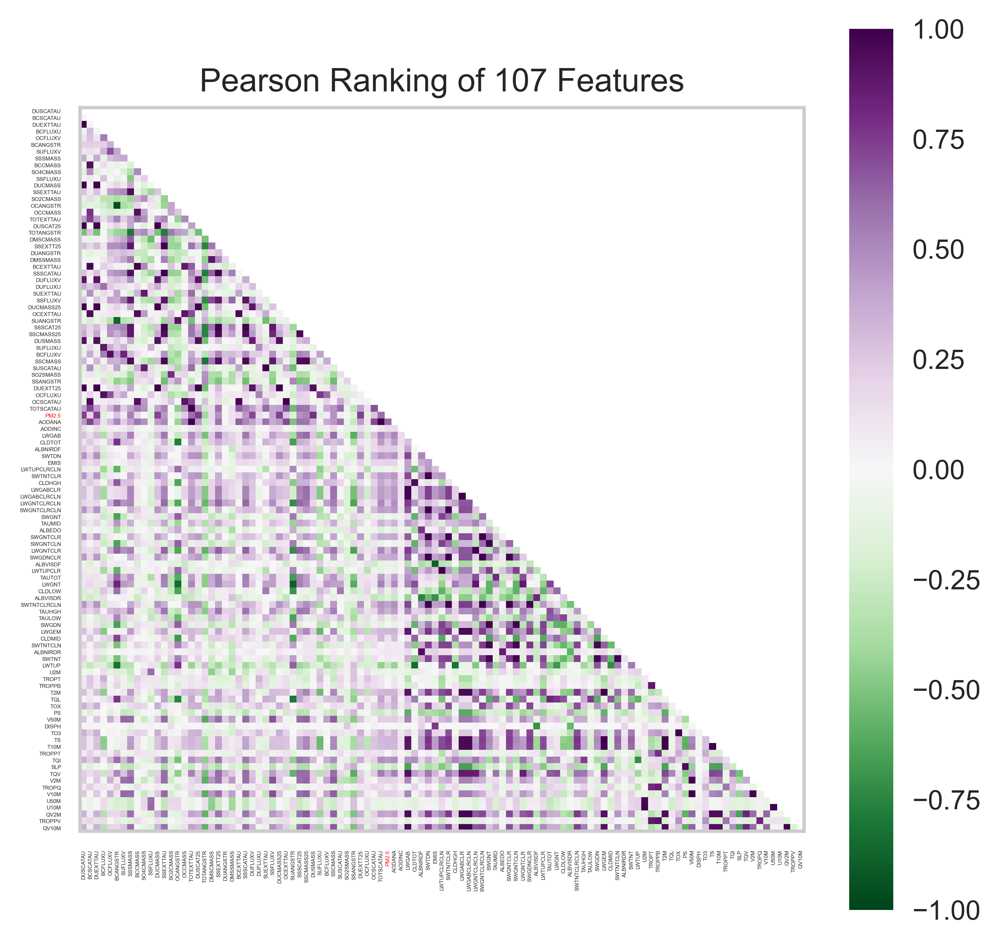

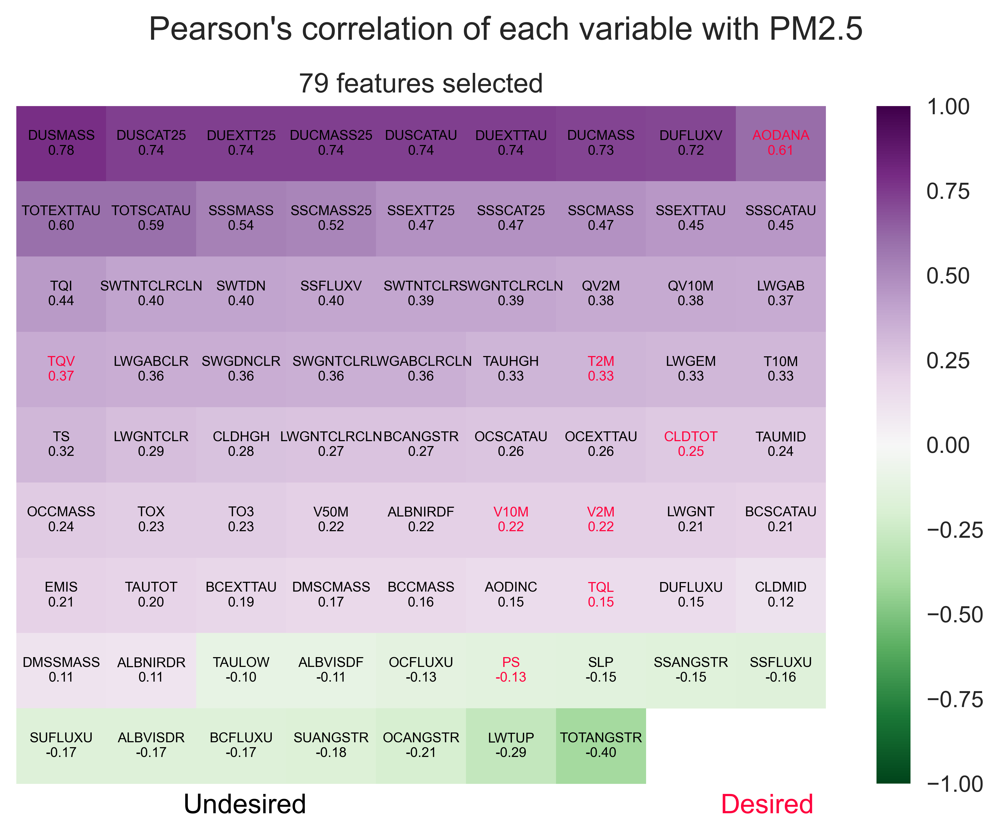

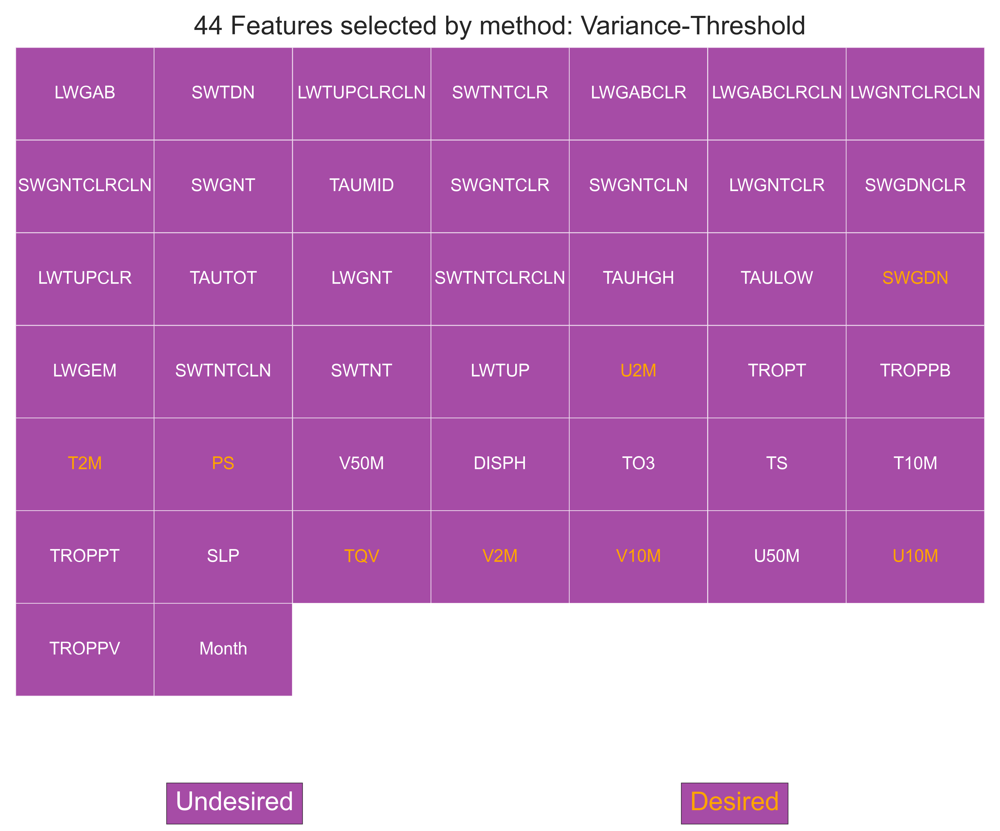

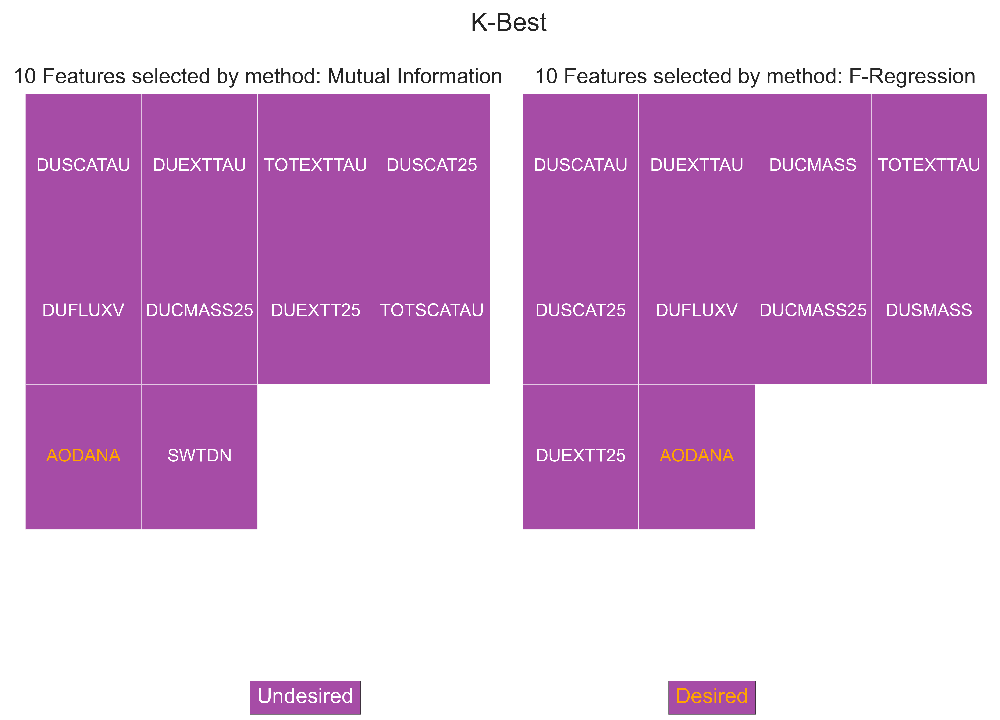

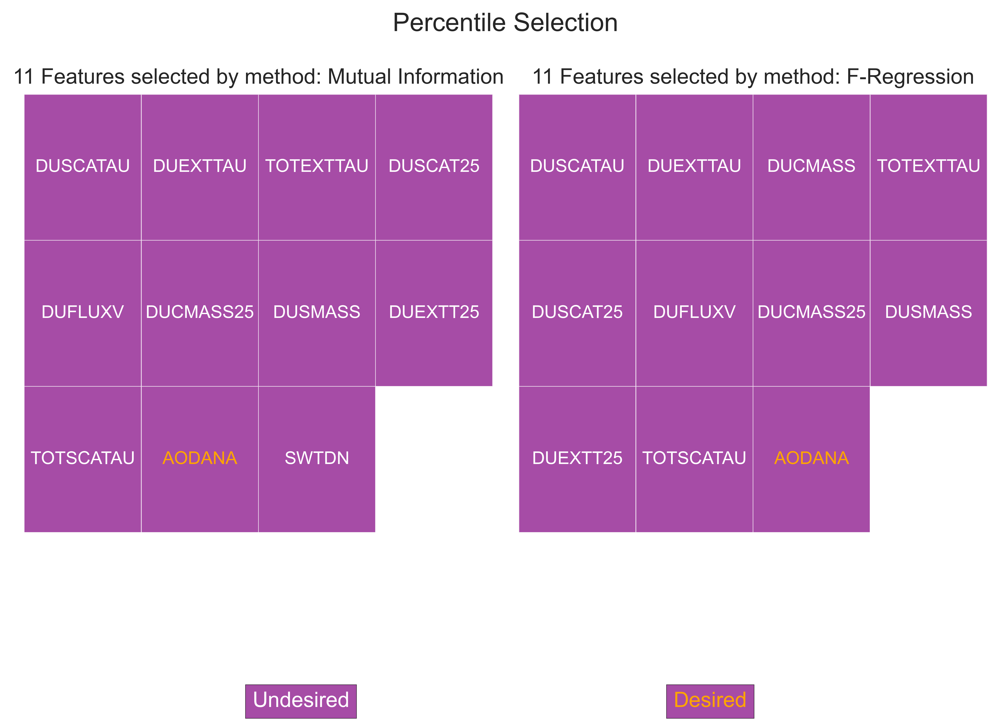

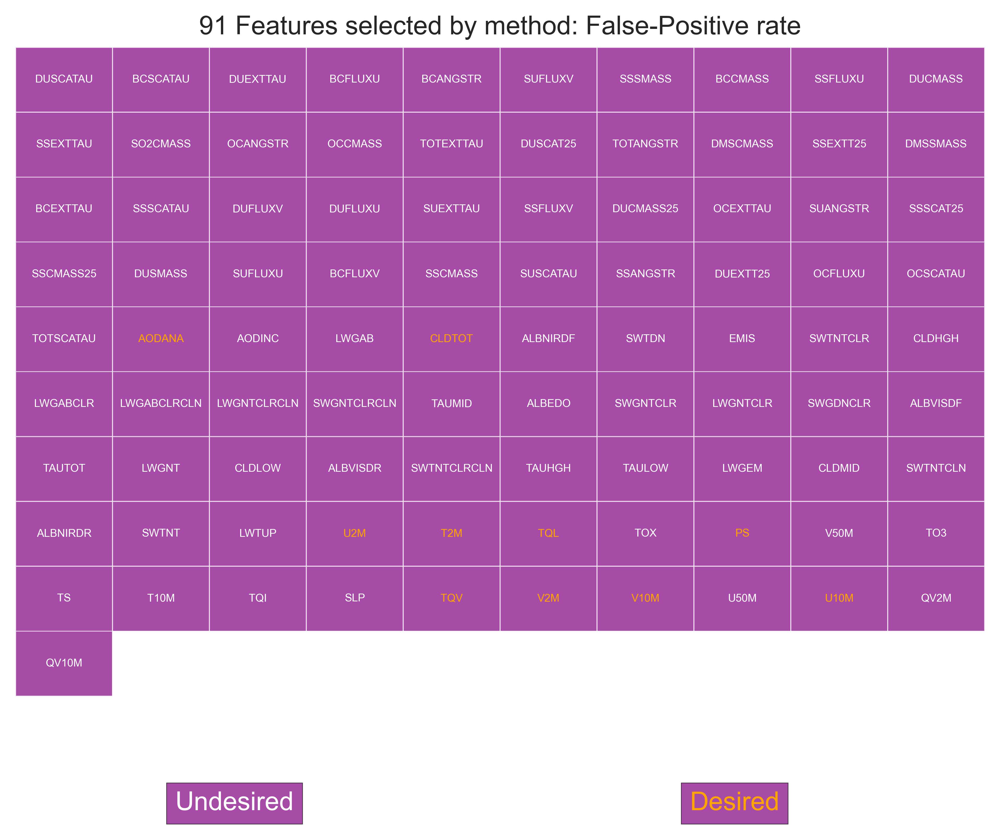

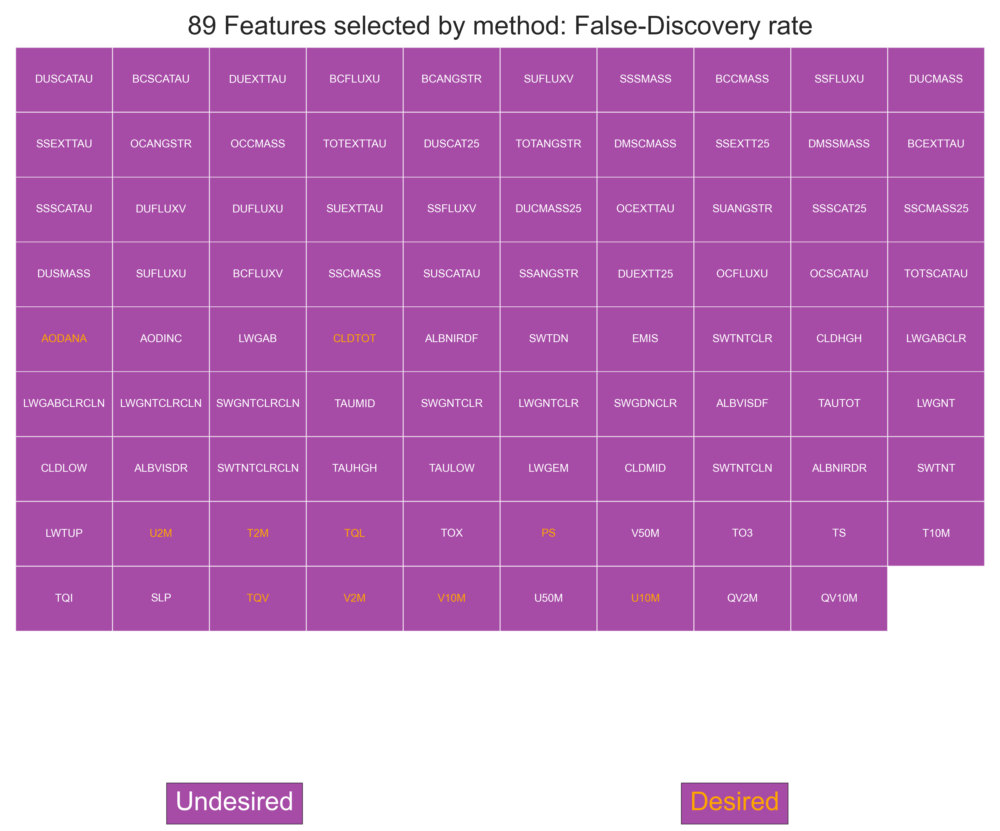

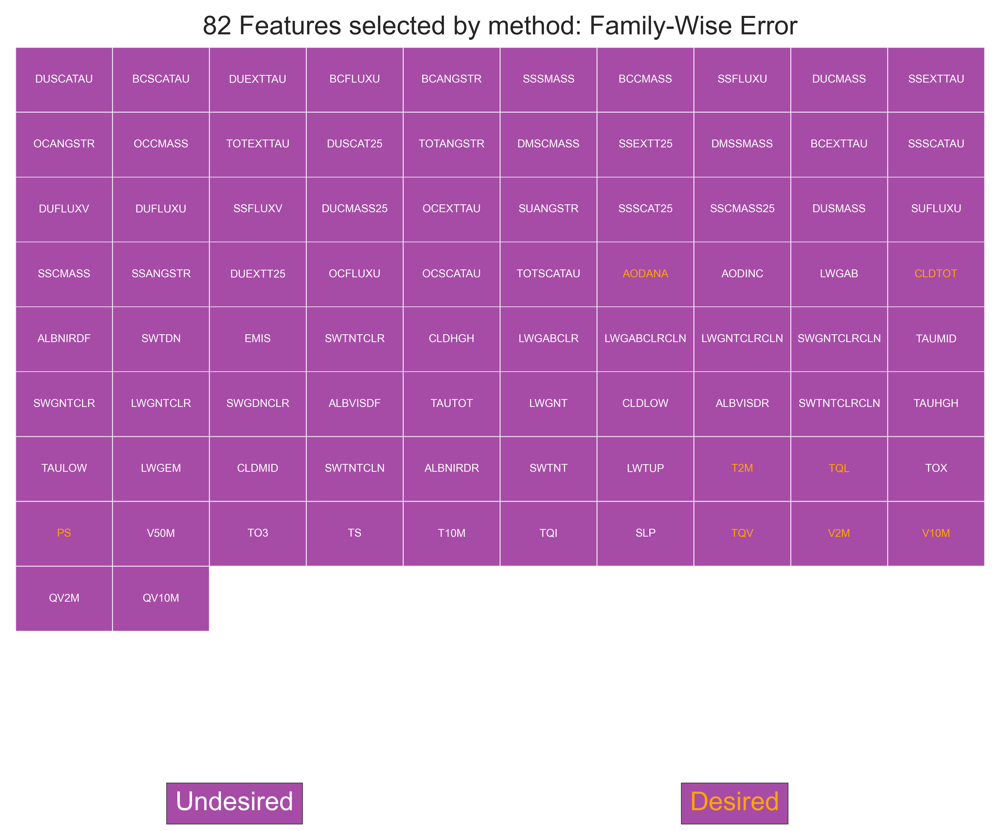

In [9]:
filters = feature_selection(train, 'PM2.5', pearson_threshold=0.1)

fontsizes = {
    'pearson_fs' : 2,
    'variance_fs' : 8, 
    'kbest_fs' : 10,
    'percentile_fs' : 10, 
    'fp_fs' : 5,
    'fd_fs' : 5,
    'fwe_fs' : 5,
    'correlation_fs': 6
}
plot_selected_features(train, 'PM2.5', ['Month'], filters, **fontsizes)

### Using A subset of All Variables

In [10]:
features = ['PS', 'QV10M', 'QV2M', 'T10M', 'T2M', 'U10M', 'U2M', 'V10M', 'V2M', 'U50M', 'V50M', 'TQL', 'TQI', 'TQV', 'ALBEDO', 'CLDTOT', 'LWGAB', 'LWGEM', 'SWGDN', 'PM2.5', 'AODANA', 'Month']

In [11]:
sub_train = train.loc[:, features]
sub_val = val.loc[:, features]
sub_test = test.loc[:, features]
display(sub_train)

,PS,QV10M,QV2M,T10M,T2M,U10M,U2M,V10M,V2M,U50M,...,TQI,TQV,ALBEDO,CLDTOT,LWGAB,LWGEM,SWGDN,PM2.5,AODANA,Month
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,102206.734375,0.005072,0.005170,279.664124,279.765778,-2.106504,-1.503023,-3.480748,-2.449461,-2.715095,...,0.027982,33.872681,0.142819,0.964355,323.165741,342.105408,55.840008,8.259367,0.140065,1
2015-01-01,101955.406250,0.004818,0.004916,278.501373,278.565674,-1.417902,-0.884811,-2.542210,-1.539559,-1.928559,...,0.038740,32.573849,0.138858,0.961823,321.957428,337.243439,41.312946,7.695491,0.134578,1
2015-01-01,102225.734375,0.004922,0.005039,279.059967,279.140472,-1.772416,-1.089089,-2.237665,-1.274900,-2.462842,...,0.031797,32.869099,0.120381,0.959483,325.946991,343.068970,45.268208,7.260243,0.127884,1
2015-01-01,102381.406250,0.005627,0.005820,281.458069,281.634613,-3.456308,-2.752680,-3.706089,-2.887856,-4.209060,...,0.024823,34.214149,0.111403,0.967845,329.548553,358.277283,60.721111,8.722021,0.135506,1
2015-01-02,101544.734375,0.006467,0.006570,282.130585,282.227631,-0.913161,-0.656459,-2.711771,-1.914652,-1.203307,...,0.043295,35.265064,0.149256,0.932393,336.696869,355.167114,70.535767,17.585114,0.206579,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-30,101761.851562,0.006787,0.006935,284.175507,284.174408,-1.249392,-0.833780,-3.539171,-2.449745,-1.862008,...,0.013979,27.163006,0.156342,0.652852,332.277985,363.854797,95.939941,12.528724,0.217242,12
2015-12-31,102221.304688,0.006975,0.007195,284.624420,284.747192,-2.554789,-2.001987,-5.035186,-3.899598,-3.205465,...,0.020379,32.787579,0.115062,0.926432,338.520538,372.444366,68.855202,7.923657,0.164006,12
2015-12-31,102050.304688,0.006353,0.006481,283.706116,283.722778,-2.003661,-1.406264,-4.159616,-2.872966,-2.753683,...,0.021405,29.052227,0.147666,0.904500,329.093445,360.598022,78.469887,8.854658,0.141486,12


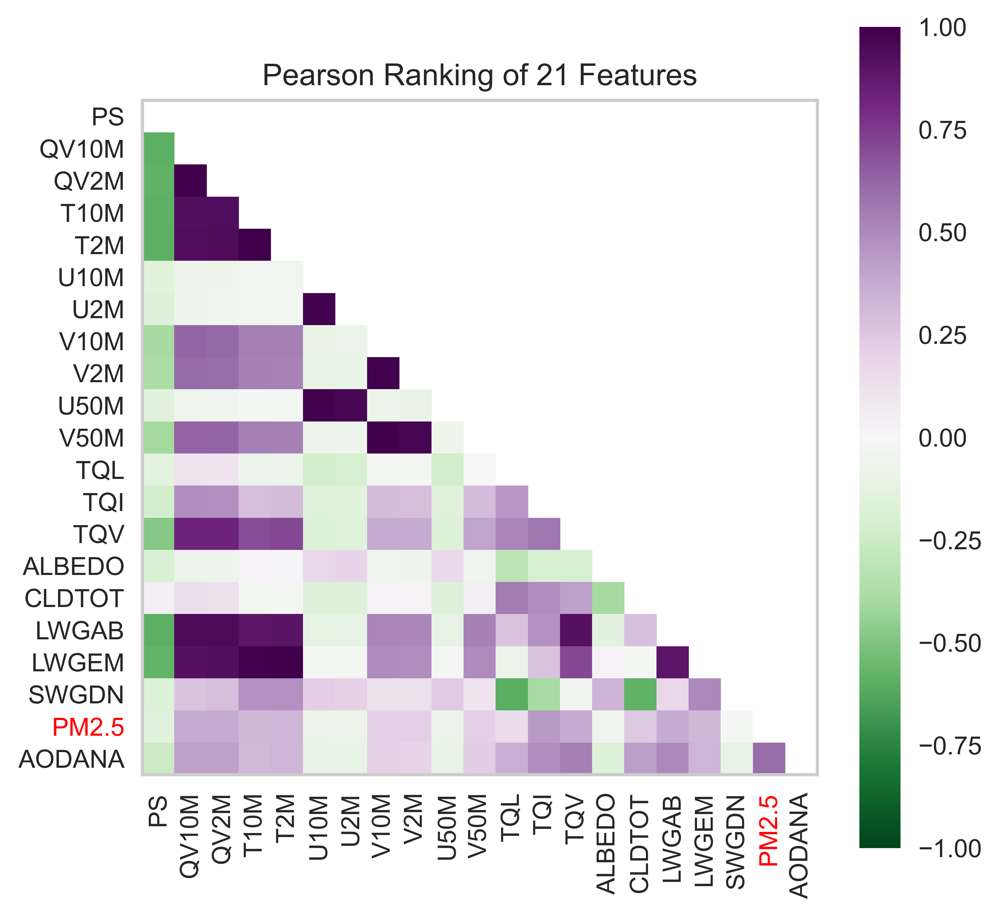

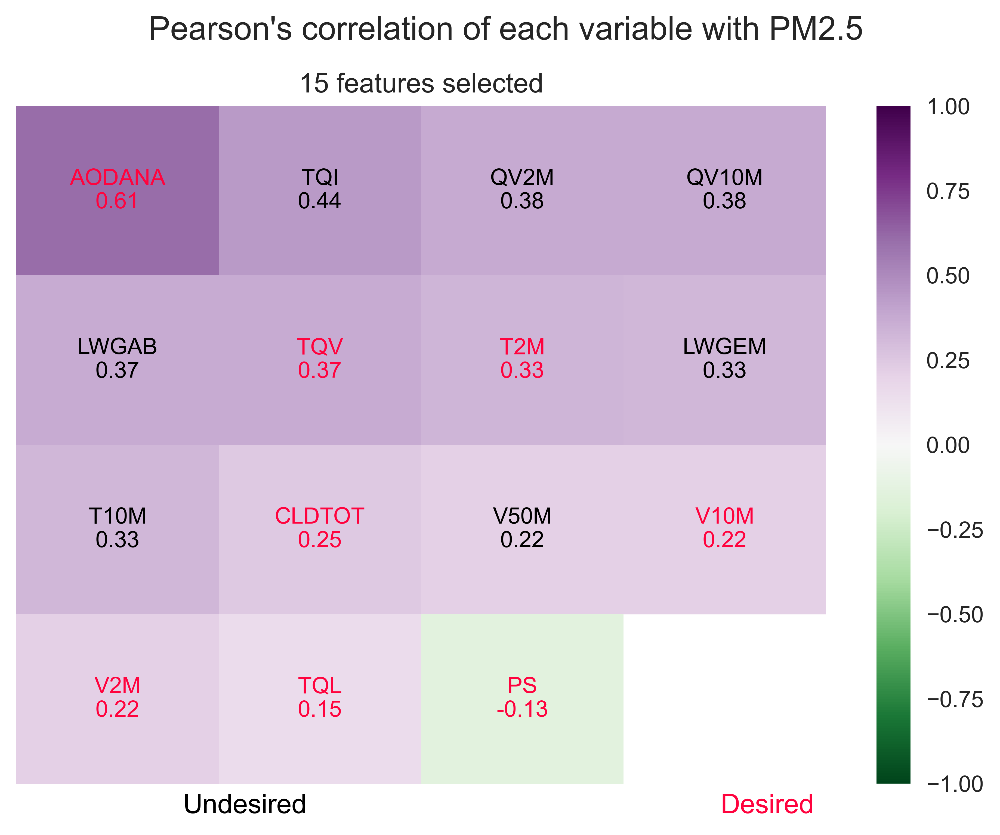

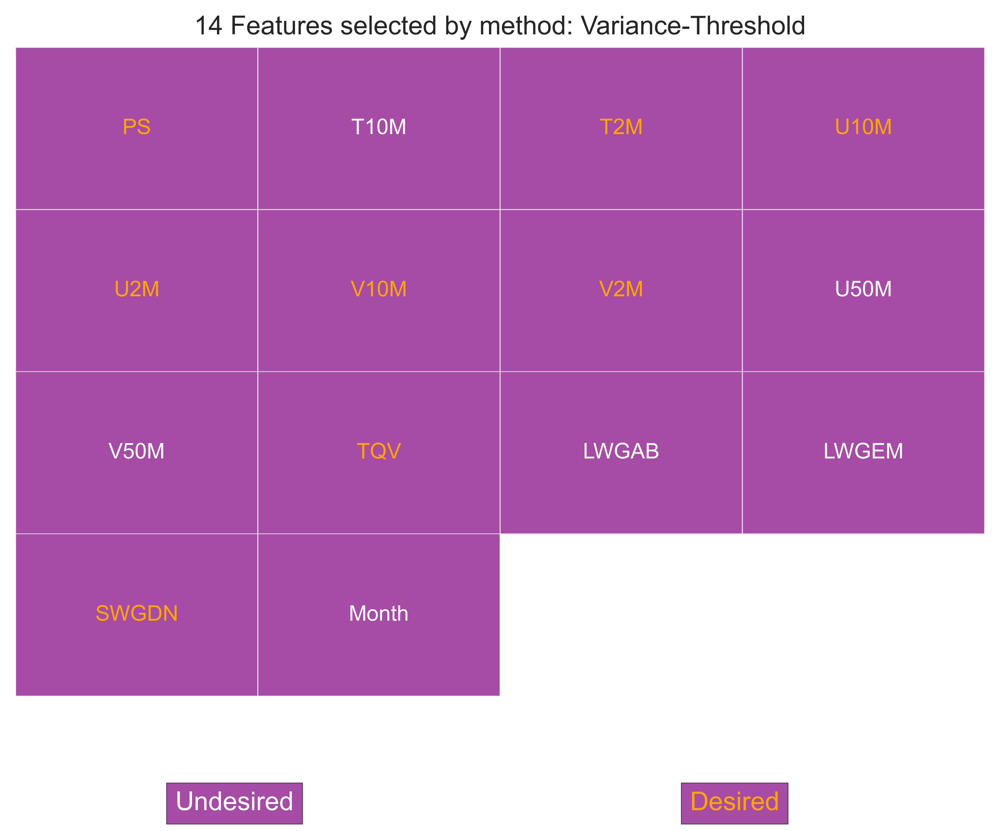

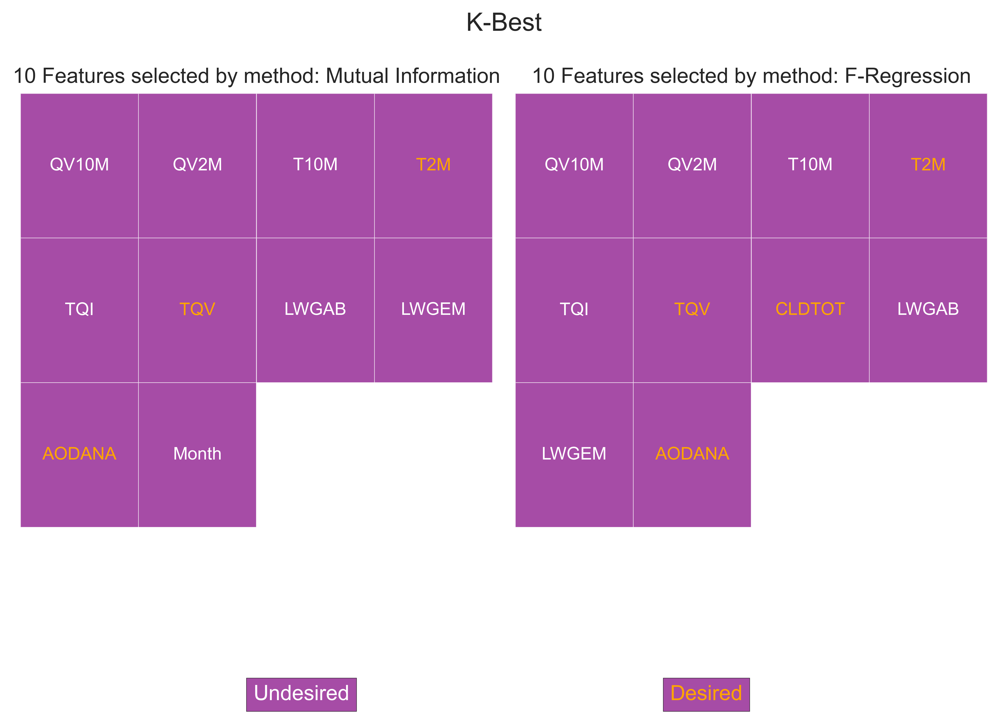

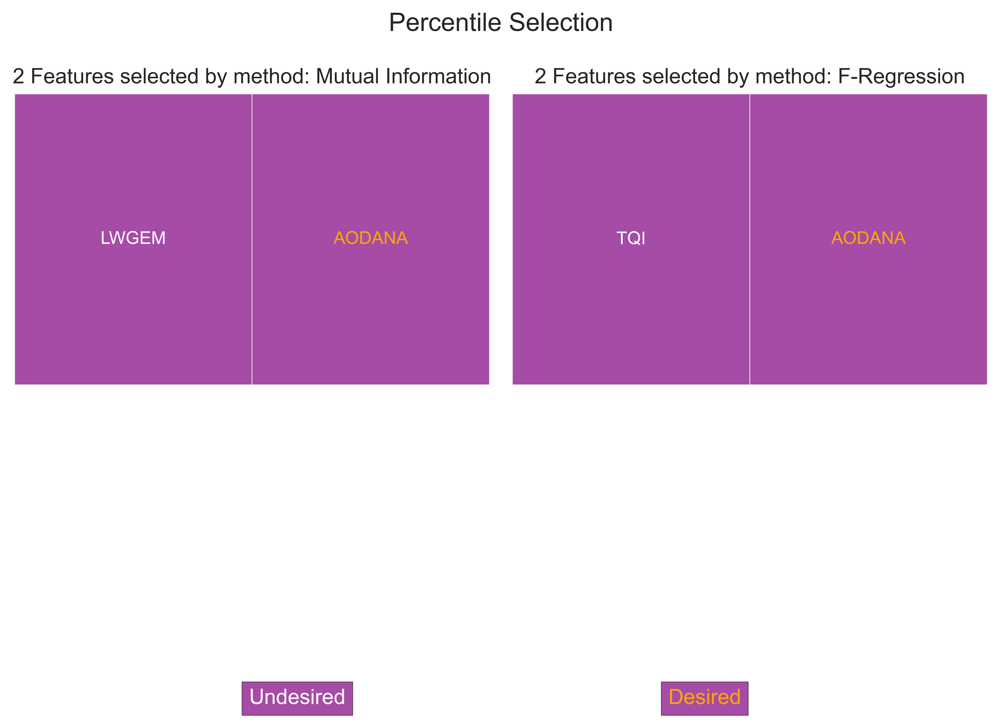

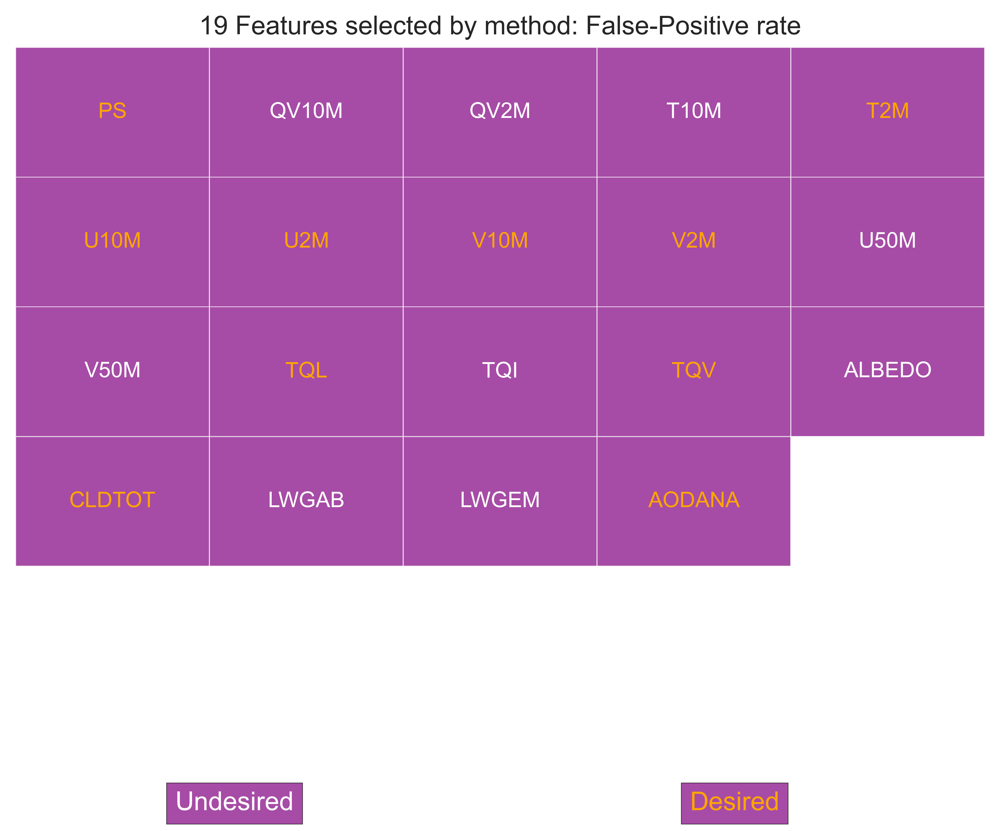

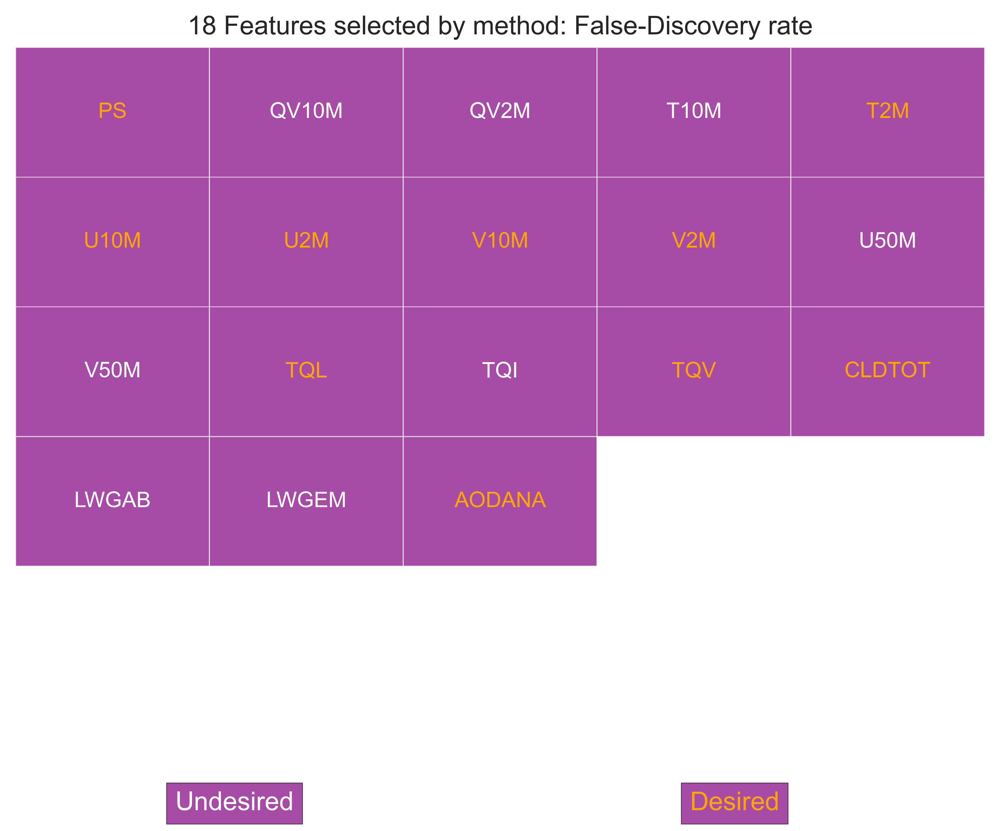

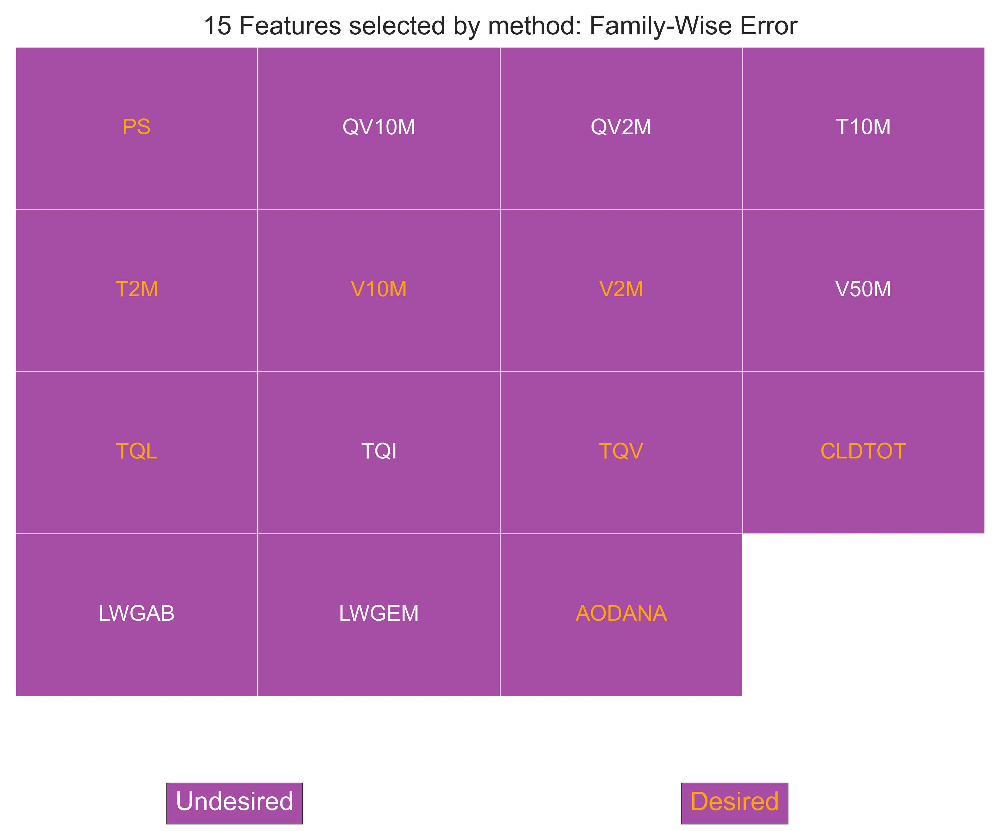

In [12]:
filters = feature_selection(sub_train, 'PM2.5')
plot_selected_features(sub_train, 'PM2.5', ['Month'], filters)

### Filter Feature Selection Update

After presenting the above results to Dr. Xu, we determined a few problems and some minor tweaks.

Problems:
1. Pearson's R should really take the absolute value of the value and then select every feature above the threshold.
2. Selecting from all of the variables is dumb because many of those variables are not available from commonly measured data. We need to pare down the total dataset to only those features which are strictly available from real-world measurements.

Tweak:
- Many of these features are very related to each other and might be redundant (FWE, FDR, FPR, for example). These might be collapsible to just one method that is representative of all of them. The purpose of these is less to select the features automatically and more to show that the features selected by humans are also supported by data-centric techniques. Perhaps, there might even be a feature that was disregarded before using these data-based methods (highly unlikely since all features selected by humans are usually selected empirically, i.e., from data). 

In [13]:
# things that are commonly measured in the real world
features_to_keep = {
'PS': 'Surface pressure',
'QV2M': '2-meter specific humidity',
'QV10M': '10-meter specific humidity',
'T2M': '2-meter air temperature',
'T10M' : '10-meter air temperature',
'U2M': '2-meter eastward wind',
'V2M': '2-meter northward wind',
'U50M': '50-meter eastward wind',
'V50M': '50-meter northward wind',
'U10M': '10-meter eastward wind',
'V10M': '10-meter northward wind',
'TQL': 'Total precipitable liquid water',
'TQI': 'Total precipitable ice water',
'TQV': 'Total precipitable water vapor',
'ALBEDO': 'Surface albedo',
'CLDTOT': 'Total cloud area fraction',
'PM2.5': 'PM2.5',
'AODANA': 'Aerosol Optical Depth Analysis',
'AODINC' : 'Aerosol Optical Depth Analysis Increment',
'EMIS' : 'surface emissivity',
'TO3' : 'total column ozone',
'TS' : 'surface skin temperature',
'SLP' : 'sea level pressure',
'TROPQ' : 'tropopause specific humidity using blended TROPP estimate',
'TROPPV' : 'tropopause pressure based on EPV estimate',
'Month' : 'Month',
}

# a list of all features from the dataset which don't have a real-world measurement commonly available
features_to_drop = {
'TROPPT' : 'tropopause pressure based on thermal estimate',
'DISPH' : 'zero plane displacement height',
'ALBVISDR' : 'surface albedo for visible beam',
'DUSCATAU': 'Dust Scattering AOT [550 nm]',
'BCSCATAU': 'Black Carbon Scattering AOT [550 nm]',
'DUEXTTAU': 'Dust Extinction AOT [550 nm]',
'BCFLUXU': 'Black Carbon column u-wind mass flux',
'OCFLUXV': 'Organic Carbon column v-wind mass flux',
'BCANGSTR' : 'Black Carbon Angstrom parameter [470-870 nm]',
'SUFLUXV' : 'SO4 column v-wind mass flux',
'SSSMASS' : 'Sea Salt Surface Mass Concentration',
'BCCMASS' : 'Black Carbon Column Mass Density',
'SO4CMASS' : 'SO4 Column Mass Density',
'SSFLUXU' : 'Sea Salt column u-wind mass flux',
'DUCMASS' : 'Dust Column Mass Density',
'SSEXTTAU' : 'Sea Salt Extinction AOT [550 nm]',
'SO2CMASS' : 'SO2 Column Mass Density',
'OCANGSTR' : 'Organic Carbon Angstrom parameter [470-870 nm]',
'OCCMASS' : 'Organic Carbon Column Mass Density',
'TOTEXTTAU' : 'Total Aerosol Extinction AOT [550 nm]',
'DUSCAT25' : 'Dust Scattering AOT [550 nm] - PM 2.5',
'TOTANGSTR' : 'Total Aerosol Angstrom parameter [470-870 nm]',
'DMSCMASS' : 'Dust Scattering AOT [550 nm] - PM 2.5',
'SSEXTT25' : 'Sea Salt Extinction AOT [550 nm] - PM 2.5',
'DUANGSTR' : 'Dust Angstrom parameter [470-870 nm]',
'DMSSMASS' : 'DMS Surface Mass Concentration',
'BCEXTTAU' : 'Black Carbon Extinction AOT [550 nm]',
'SSSCATAU' : 'Sea Salt Scattering AOT [550 nm]',
'DUFLUXV' : 'Dust column v-wind mass flux',
'DUFLUXU' : 'Dust column u-wind mass flux',
'SUEXTTAU' : 'SO4 Extinction AOT [550 nm]',
'SSFLUXV' : 'Sea Salt column v-wind mass flux',
'DUCMASS25' : 'Dust Column Mass Density - PM 2.5',
'OCEXTTAU' : 'Organic Carbon Extinction AOT [550 nm]',
'SUANGSTR' : 'SO4 Angstrom parameter [470-870 nm]',
'SSSCAT25' : 'Sea Salt Scattering AOT [550 nm] - PM 2.5',
'SSCMASS25' : 'Sea Salt Column Mass Density - PM 2.5',
'DUSMASS' : 'Dust Surface Mass Concentration',
'SUFLUXU' : 'SO4 column u-wind mass flux',
'BCFLUXV' : 'Black Carbon column v-wind mass flux',
'SSCMASS' : 'Sea Salt Column Mass Density',
'SUSCATAU' : 'SO4 Scattering AOT [550 nm]',
'SO2SMASS' : 'SO2 Surface Mass Concentration',
'SSANGSTR' : 'Sea Salt Angstrom parameter [470-870 nm]',
'DUEXTT25' : 'Dust Extinction AOT [550 nm] - PM 2.5',
'OCFLUXU' : 'Organic Carbon column u-wind mass flux',
'OCSCATAU' : 'Organic Carbon Scattering AOT [550 nm]',
'TOTSCATAU' : 'Total Aerosol Scattering AOT [550 nm]',
'LWTUPCLRCLN' : 'upwelling longwave flux at toa assuming clear sky and no aerosol',
'SWTNTCLR' : 'toa net downward shortwave flux assuming clear sky',
'CLDHGH' : 'cloud area fraction for high clouds',
'LWGABCLR' : 'surface absorbed longwave radiation assuming clear sky',
'LWGABCLRCLN' : 'surface absorbed longwave radiation assuming clear sky and no aerosol',
'LWGNTCLRCLN' : 'surface net downward longwave flux assuming clear sky and no aerosol',
'SWGNTCLRCLN' : 'surface net downward shortwave flux assuming clear sky and no aerosol',
'SWGNT' : 'sea ice net downward shortwave flux',
'TAUMID' : 'in cloud optical thickness of middle clouds',
'SWGNTCLR' : 'surface net downward shortwave flux assuming clear sky',
'SWGNTCLN' : 'surface net downward shortwave flux assuming no aerosol',
'LWGNTCLR' : 'surface net downward longwave flux assuming clear sky',
'SWGDNCLR' : 'surface incoming shortwave flux assuming clear sky',
'ALBVISDF' : 'surface albedo for visible diffuse',
'LWTUPCLR' : 'upwelling longwave flux at toa assuming clear sky',
'TAUTOT' : 'in cloud optical thickness of all clouds',
'LWGNT' : 'sea ice net downward longwave flux',
'CLDLOW' : 'cloud area fraction for low clouds',
'SWTNTCLRCLN' : 'toa net downward shortwave flux assuming clear sky and no aerosol',
'TAUHGH' : 'in cloud optical thickness of high clouds(EXPORT)',
'TAULOW' : 'in cloud optical thickness of low clouds',
'CLDMID' : 'cloud area fraction for middle clouds',
'SWTNTCLN' : 'toa net downward shortwave flux assuming no aerosol',
'ALBNIRDR' : 'surface albedo for near infrared beam',
'SWTNT' : 'toa net downward shortwave flux',
'LWTUP' : 'upwelling longwave flux at toa',
'TROPT' : 'tropopause temperature using blended TROPP estimate',
'TROPPB' : 'tropopause pressure based on blended estimate',
'TOX' : 'total column odd oxygen',
'LWGAB': 'Surface absorbed longwave radiation',
'LWGEM': 'Longwave flux emitted from surface',
'SWGDN': 'Surface incoming shortwave flux',
'ALBNIRDF' : 'surface albedo for near infrared diffuse',
'SWTDN' : 'toa incoming shortwave flux',
}

assert(len(features_to_drop.keys()) + len(features_to_keep.keys()) == len(train.columns.values))

In [14]:
sub = train.drop(features_to_drop, axis=1)
filters = feature_selection(sub, 'PM2.5', pearson_threshold=0.1)

In [20]:
def feature_selection_plot_ranked(df, method, argsort=None, fig = None, ax=None, **kwargs):
    """
        ---
        paramaters:
            argsort: the indices which would sort the columns of df in order of importance in ascending order
    """
    features = df.columns.values[argsort[::-1]]
    
    params = {
        'desired_features': ['PS', 'T2M', 'U2M', 'V2M', 'U10M', 'V10M', 'TQL', 'TQV', 'CLDTOT', 'SWGDN', 'AODANA', 'Month'],
        'desired_feature_color' : 'orange',
        'filter_selected_color':'white',
        'alpha': 0.7,
        'fontsize': 10
    }
    
    params.update(kwargs)
    
    if ax is None:
        fig, ax = plt.subplots(dpi=600)

    # make a square array and fill the new values with np.nan so that they are not displayed
    s = int(np.ceil(np.sqrt(len(features))))
    a = np.zeros(s**2)
    # mask the invalid values
    a[len(features):] = np.nan
    a = np.reshape(a, (s, s))

    mappable = ax.pcolormesh(a, cmap=mplColors.ListedColormap(['purple']), alpha=params['alpha'], edgecolor='white')

    # put the invalid values on the bottom right
    ax.invert_yaxis()

    for i in range(s):
        for j in range(s):
            if s*i + j < len(features):
                label = features[s*i + j]
                color = params['desired_feature_color'] if label in params['desired_features'] else params['filter_selected_color']
                text = ax.text(j+.5, i+0.5, f'{label}\nRank:{s*i + j + 1}',
                               ha="center", va="center", color=color, fontsize=params['fontsize'])

    ax.set_yticklabels([]);
    ax.set_xticklabels([]);

    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    if fig is not None:
        fs_t = fig.text(0.3, 0, 'Undesired', horizontalalignment='center',
            verticalalignment='center', 
                color=params['filter_selected_color'])

        d_t = fig.text(.7, 0, 'Desired', horizontalalignment='center',
            verticalalignment='center', 
                color=params['desired_feature_color'])

        fs_t.set_bbox(dict(facecolor='purple', alpha=params['alpha']))
        d_t.set_bbox(dict(facecolor='purple', alpha=params['alpha']))

    ax.set_title(f"{len(features)} Features selected by method: {method}");

def plot_selected_features_ranked(df, prediction_feature, excluded_pearson_vars, filters,
                     pearson_fs = 10,
                     correlation_fs = 10,
                     variance_fs = 10, 
                     kbest_fs = 10, 
                     percentile_fs = 10, 
                     fp_fs = 10, 
                     fd_fs = 10, 
                     fwe_fs = 10):
    x, y = df.drop(prediction_feature, axis=1), df[prediction_feature]
    
    #
    # Plot Pearson
    #
    fig, ax = plt.subplots(figsize=(6, 6), dpi=600)

    pearson_vars = df.drop(excluded_pearson_vars, axis=1)
    visualizer = Rank2D(algorithm='pearson', ax=ax, colormap='PRGn_r')
    visualizer.fit(pearson_vars)
    visualizer.transform(pearson_vars)

    ax.tick_params(axis='both', which='major', labelsize=pearson_fs)

    for labels in [ax.get_xticklabels(), ax.get_yticklabels()]:
        for t in filter(lambda x: x.get_text() == prediction_feature, labels):
            t.set_color('red')

    visualizer.show();
    
    #
    # Correlation-selection
    #
    selected = df.loc[:, filters['correlation']]
    pearson_plot(selected, prediction_feature, fontsize=correlation_fs)
    
    #
    # Variance threshold
    #
    which = 'variance-threshold'
    scores = filters[which].variances_[filters[which].get_support()]
    argsort = np.argsort(scores)
    
    selected = x.loc[:, filters[which].get_support()]
    feature_selection_plot_ranked(selected, 'Variance-Threshold', argsort=argsort, fontsize=variance_fs)
    
    # 
    # Select K-best
    #
    fig, axes = plt.subplots(1, 2, dpi=600)

    for idx, (which, label) in enumerate([('kbest-mi', 'Mutual Information'), ('kbest-fr', 'F-Regression')]):
        scores = filters[which].scores_[filters[which].get_support()]
        argsort = np.argsort(scores)

        selected = x.loc[:, filters[which].get_support()]
        feature_selection_plot_ranked(selected, label, argsort=argsort, ax = axes[idx], fontsize=kbest_fs)

    fig.suptitle('K-Best')
    fig.tight_layout()
    
    #
    # Percentile selection
    #
    fig, axes = plt.subplots(1, 2, dpi=600)

    for idx, (which, label) in enumerate([('percentile-mi', 'Mutual Information'), ('percentile-fr', 'F-Regression')]):
        scores = filters[which].scores_[filters[which].get_support()]
        argsort = np.argsort(scores)

        selected = x.loc[:, filters[which].get_support()]
        feature_selection_plot_ranked(selected, label, argsort=argsort, ax = axes[idx], fontsize=percentile_fs)

    fig.suptitle('Percentile Selection')
    fig.tight_layout()
    
    #
    # False-positive rate
    #
    which = 'fpr'
    scores = filters[which].scores_[filters[which].get_support()]
    argsort = np.argsort(scores)
    
    selected = x.loc[:, filters[which].get_support()]
    feature_selection_plot_ranked(selected, 'False-Positive rate', argsort=argsort, fontsize=fp_fs)
    
    #
    # False-discovery Rate
    #    
    which = 'fdr'
    scores = filters[which].scores_[filters[which].get_support()]
    argsort = np.argsort(scores)
    
    selected = x.loc[:, filters[which].get_support()]
    feature_selection_plot_ranked(selected, 'False-Discovery rate', argsort=argsort, fontsize=fd_fs)
    
    #
    # Family-wise Error
    #
    which = 'fwe'
    scores = filters[which].scores_[filters[which].get_support()]
    argsort = np.argsort(scores)
    
    selected = x.loc[:, filters[which].get_support()]
    feature_selection_plot_ranked(selected, 'Family-Wise Error', argsort=argsort, fontsize=fwe_fs)

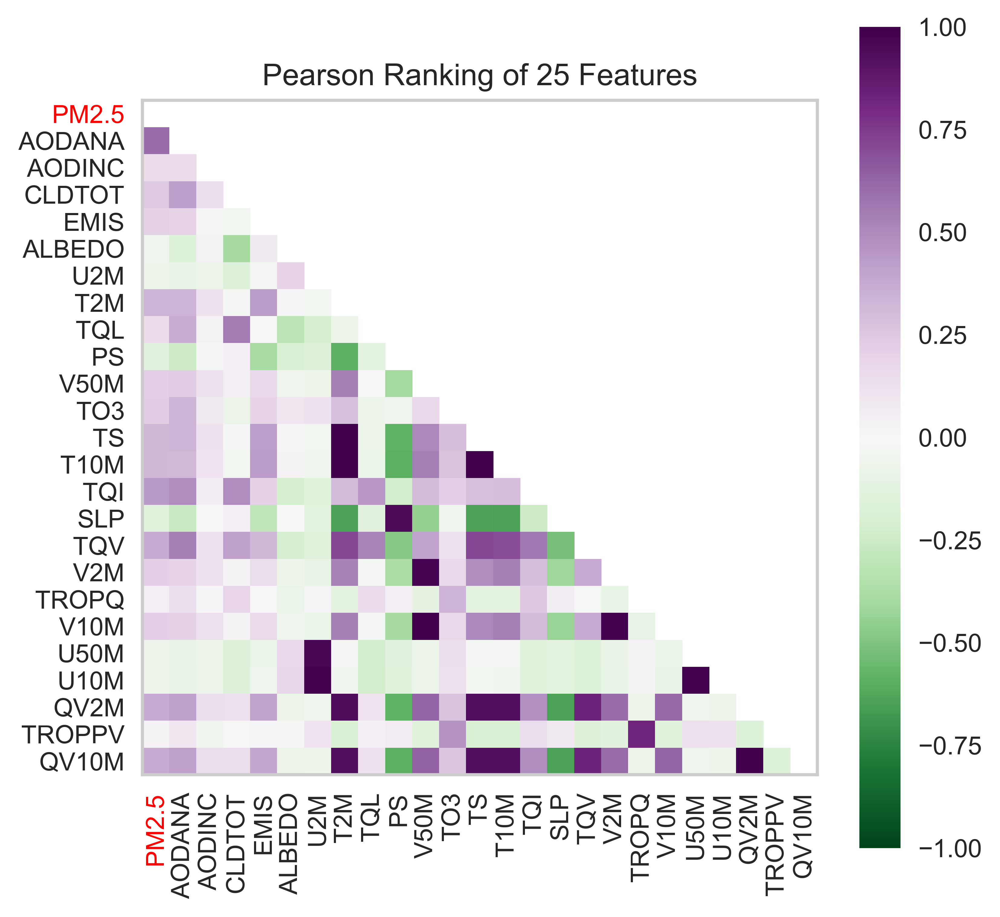

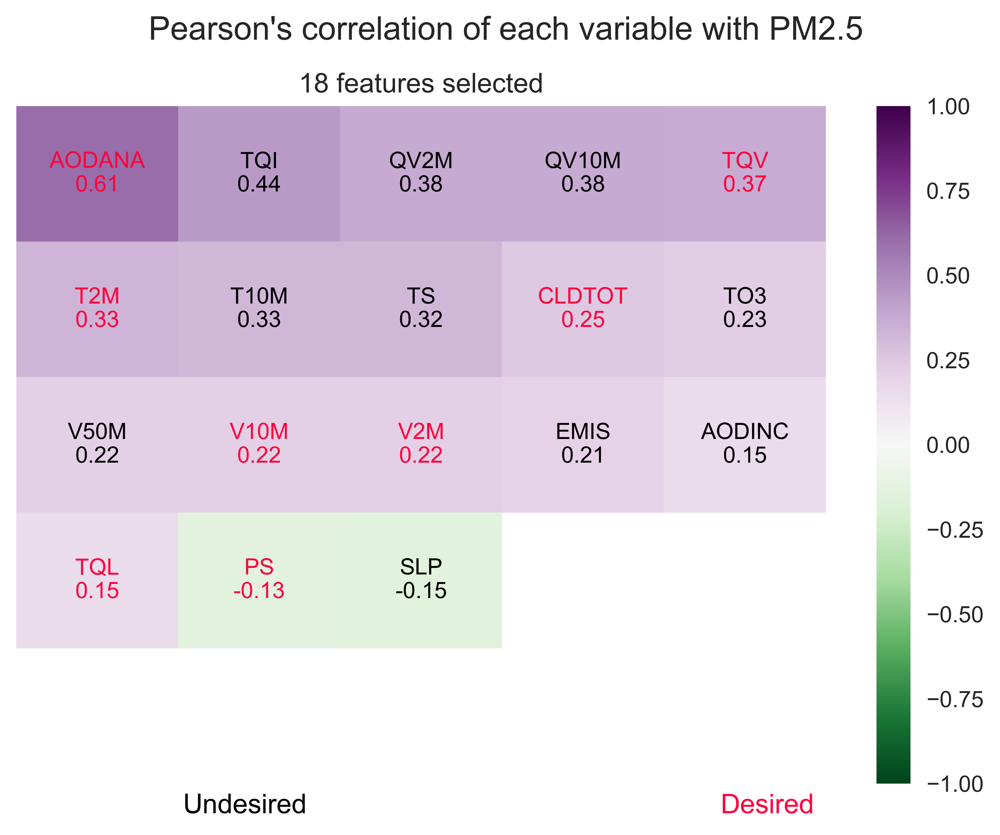

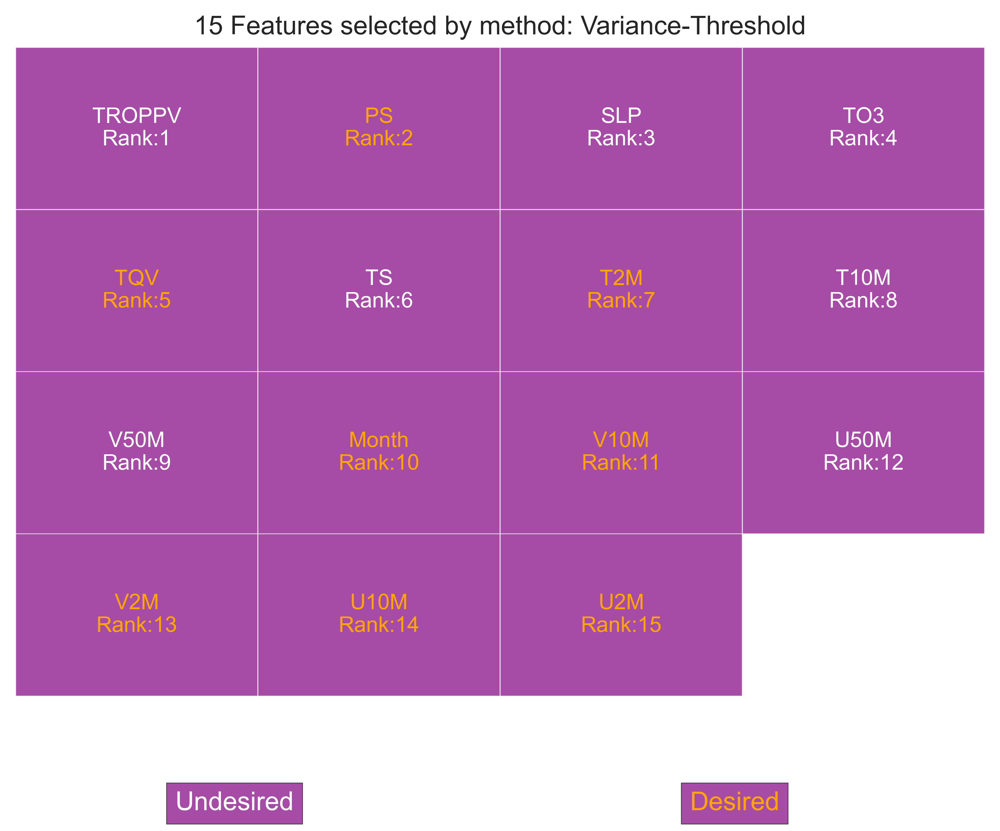

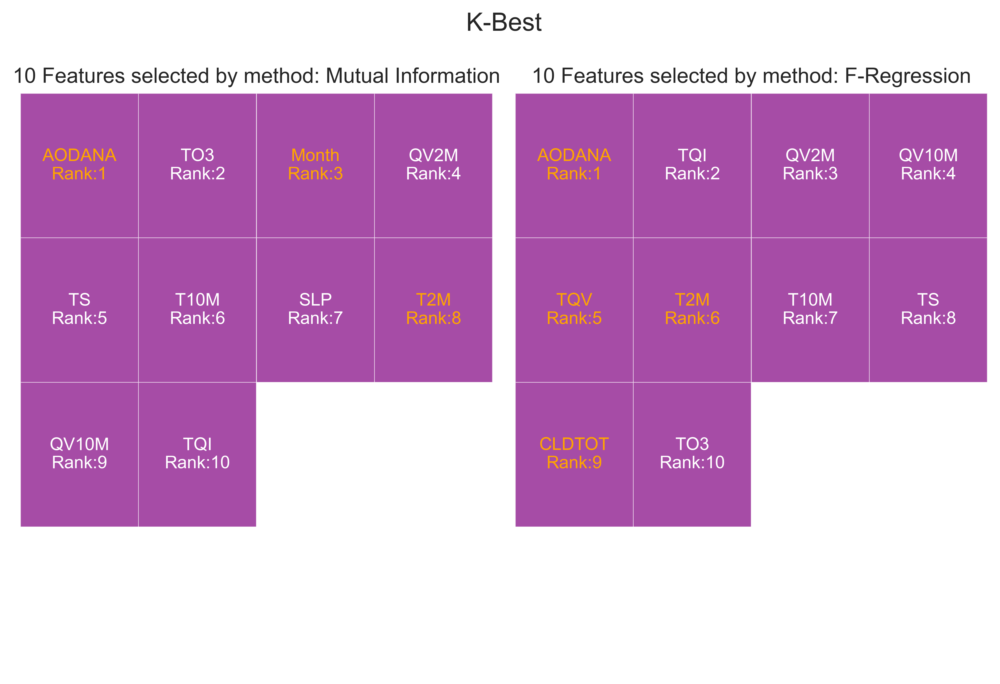

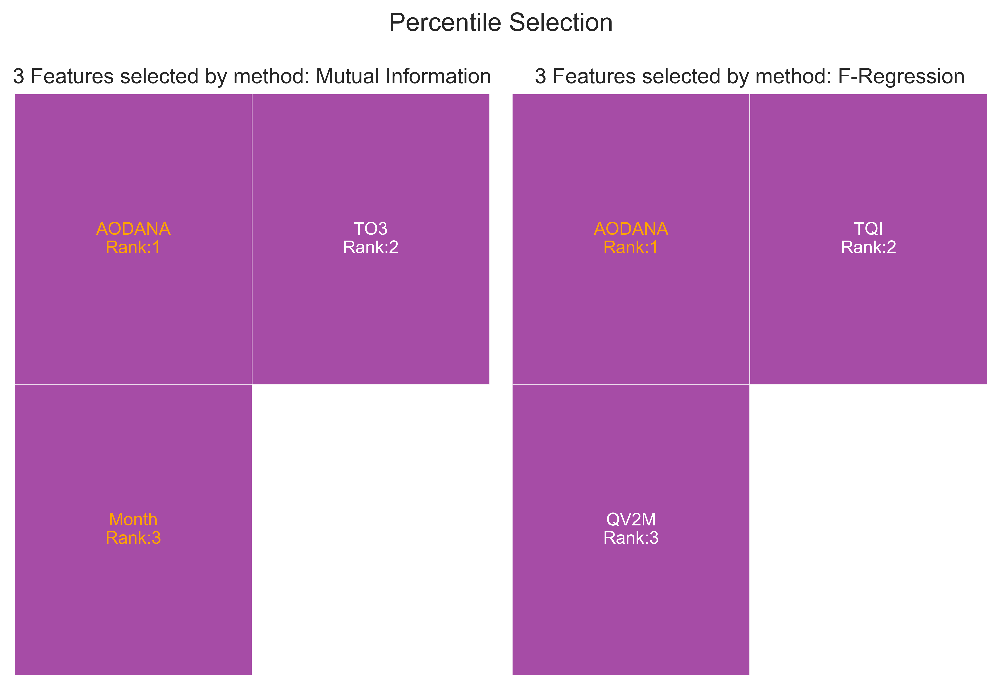

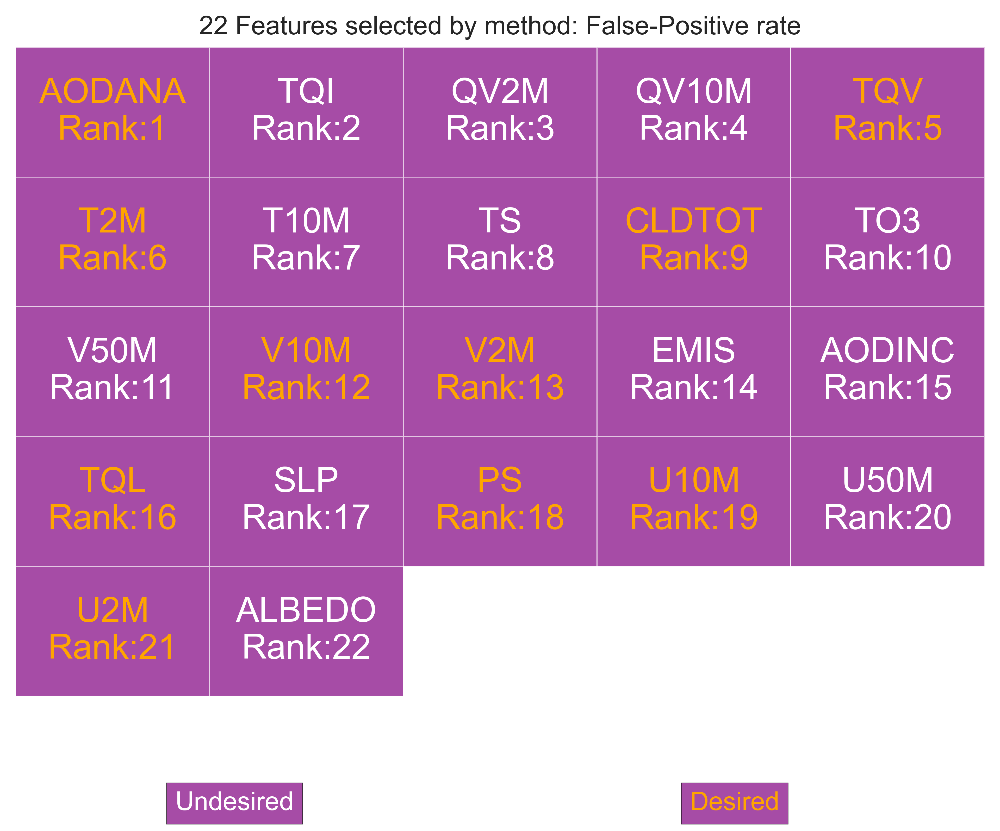

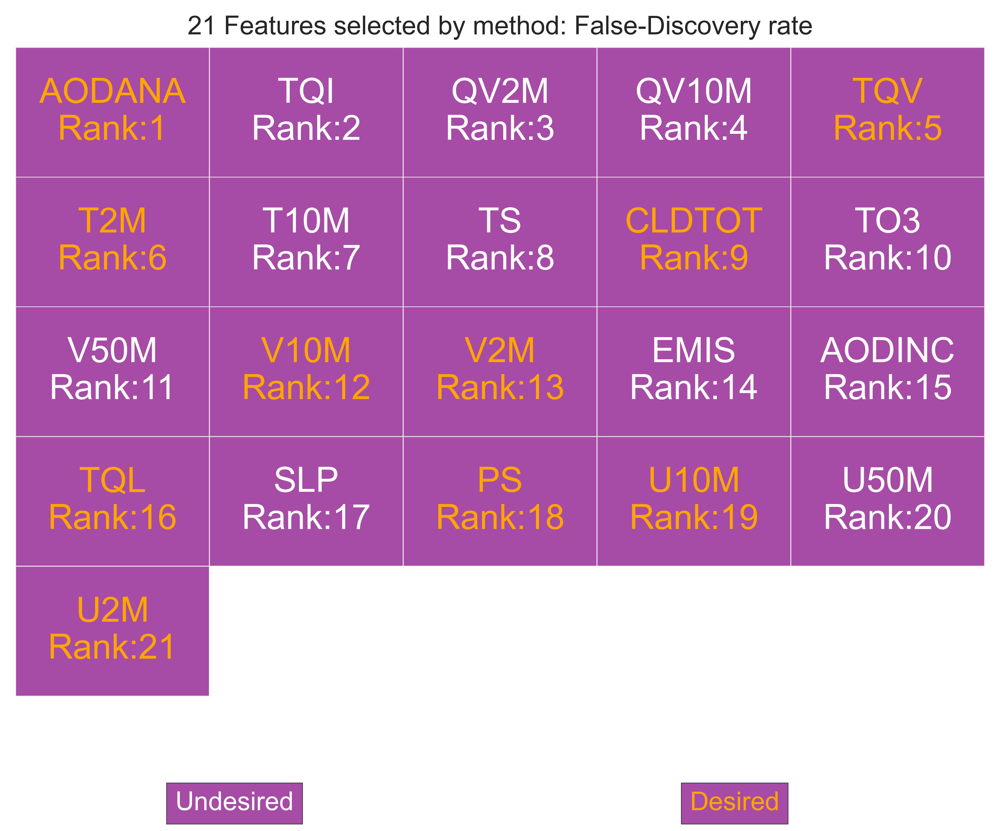

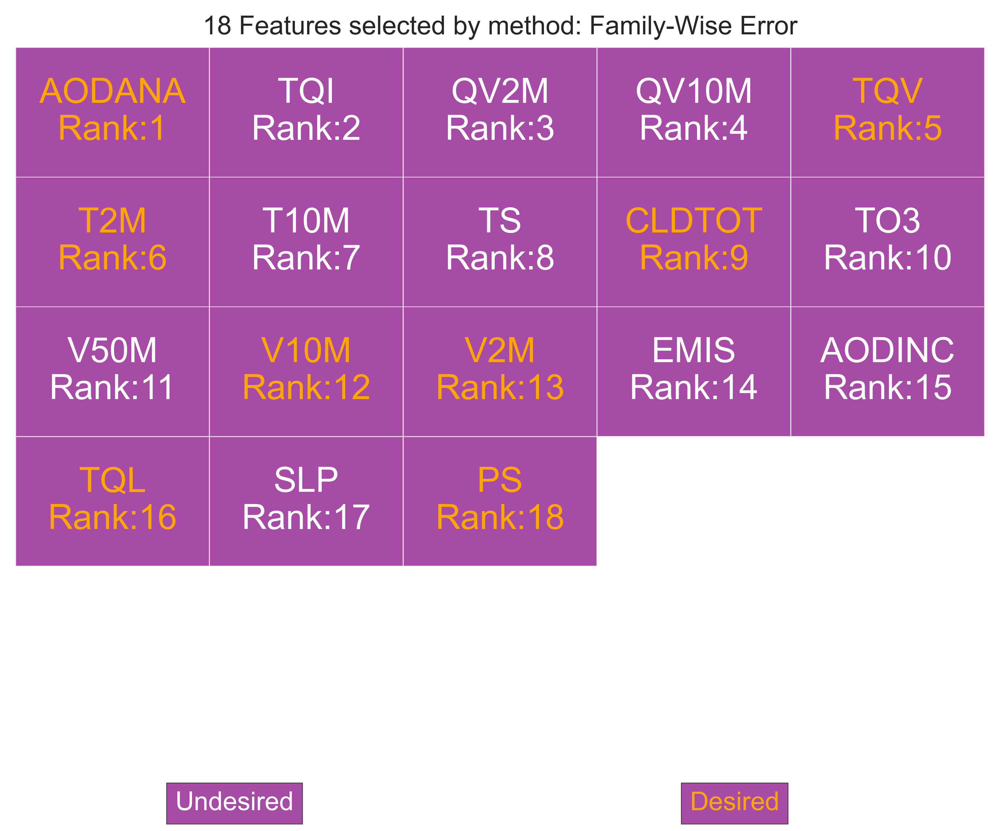

In [23]:
kwargs = {
    'fp_fs': 16, 
    'fd_fs': 16, 
    'fwe_fs': 16
}
plot_selected_features_ranked(sub, 'PM2.5', ['Month'], filters, **kwargs)

In [29]:
x = sub.drop('PM2.5', axis=1)
columns = x.loc[:, filters['fpr'].get_support()].columns.values
for col in columns:
    print(f'{col} = {translations[col]}')

AODANA = Aerosol Optical Depth Analysis
AODINC = Aerosol Optical Depth Analysis Increment
CLDTOT = Total cloud area fraction
EMIS = surface emissivity
ALBEDO = Surface albedo
U2M = 2-meter eastward wind
T2M = 2-meter air temperature
TQL = Total precipitable liquid water
PS = Surface pressure
V50M = 50-meter northward wind
TO3 = total column ozone
TS = surface skin temperature
T10M = 10-meter air temperature
TQI = Total precipitable ice water
SLP = sea level pressure
TQV = Total precipitable water vapor
V2M = 2-meter northward wind
V10M = 10-meter northward wind
U50M = 50-meter eastward wind
U10M = 10-meter eastward wind
QV2M = 2-meter specific humidity
QV10M = 10-meter specific humidity


I like mutual information with k-best. That's what I'll use.